In [5]:
#Download necessary package
library(ggplot2)

In [6]:
ad_subj_data <- read.csv("~/linear_regression/UKBB_ad_data_other.csv")
fa_subj_data <- read.csv("~/linear_regression/UKBB_fa_data_other.csv")
md_subj_data <- read.csv("~/linear_regression/UKBB_md_data_other.csv")
rd_subj_data <- read.csv("~/linear_regression/UKBB_rd_data_other.csv")

In [7]:
# Define necessary variables
subject_data <- list(ad_subj_data, fa_subj_data, md_subj_data, rd_subj_data)
subject_datasets <- c("ad", "fa", "md", "rd")
subject_datasets_upper <- c("AD", "FA", "MD", "RD")
brain_regions <- c("caudate", "putamen", "nacc", "hippocampus", "pallidum", "full_hypo")
brain_regions_upper <- c("Caudate", "Putamen", "Nucleus Accumbens", "Hippocampus", "Pallidum", "Hypothalamus")
vars <- c("BMI", "CRP", "Glucose", "HBA1C", "Cholesterol", "HDL_Chol", "LDL_Chol", "Triglycerides", "Systolic_BP", "Diastolic_BP")
variables <- c("body_mass_index_bmi_21001.2.0", "c.reactive_protein_30710.0.0", 
                        "glucose_30740.0.0", "glycated_haemoglobin_hba1c_30750.0.0", 
                        "cholesterol_30690.0.0", "hdl_cholesterol_30760.0.0", 
                        "ldl_direct_30780.0.0", "triglycerides_30870.0.0", 
                        "systolic_blood_pressure_automated_reading_4080.0.1", 
                        "diastolic_blood_pressure_automated_reading_4079.0.1")

In [8]:
# Initialize an empty list to store plots
plot_list <- list()

for (i in seq_along(subject_data)) {
    current_data <- subject_data[[i]]
    j=1
    
    # Loop through each brain region
    for (region_name in brain_regions) {
        k=1
        # Loop through each obesity-related parameter
        for (variable_name in variables) {
            # Calculate regression for current region, parameter, and DTI metric
            lm_model <- lm(get(region_name) ~ get(variable_name) + 
                               age_when_attended_assessment_centre_21003.2.0 +
                               poly(age_when_attended_assessment_centre_21003.2.0, 2, raw=TRUE) * sex_31.0.0 +
                               poly(difftime(as.Date(date_of_attending_assessment_centre_53.2.0),
                                    min(as.Date(date_of_attending_assessment_centre_53.2.0)), units='days'), 2, raw=TRUE) + 
                               uk_biobank_assessment_centre_54.2.0 + 
                               volume_of_estimatedtotalintracranial_whole_brain_26521.2.0, data = current_data)
            
            # Create the plot
            current_plot <- ggplot(current_data, aes(x = !!sym(variable_name), y = !!sym(region_name))) +
                geom_point(color = "blue") +
                geom_smooth(method = "lm", formula = y ~ x, se = TRUE, color = "red") +
                geom_text(aes(x = max(current_data[[variable_name]]), y = max(current_data[[region_name]])),
                          label = paste("N =", nrow(current_data)),
                          hjust = 1, vjust = 1, color = "black") +
                labs(title = paste("UKBB", subject_datasets_upper[i], "and", vars[k], "Correlation in the", brain_regions_upper[j]),
                     x = vars[k], y = paste("Average Values for ", subject_datasets_upper[i], " ", brain_regions_upper[j]))
            
            # Append the plot to the list
            plot_list[[length(plot_list) + 1]] <- current_plot
            k=k+1
        }
        j=j+1
    }
}

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 1841 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 1841 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”
Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3952 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3952 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


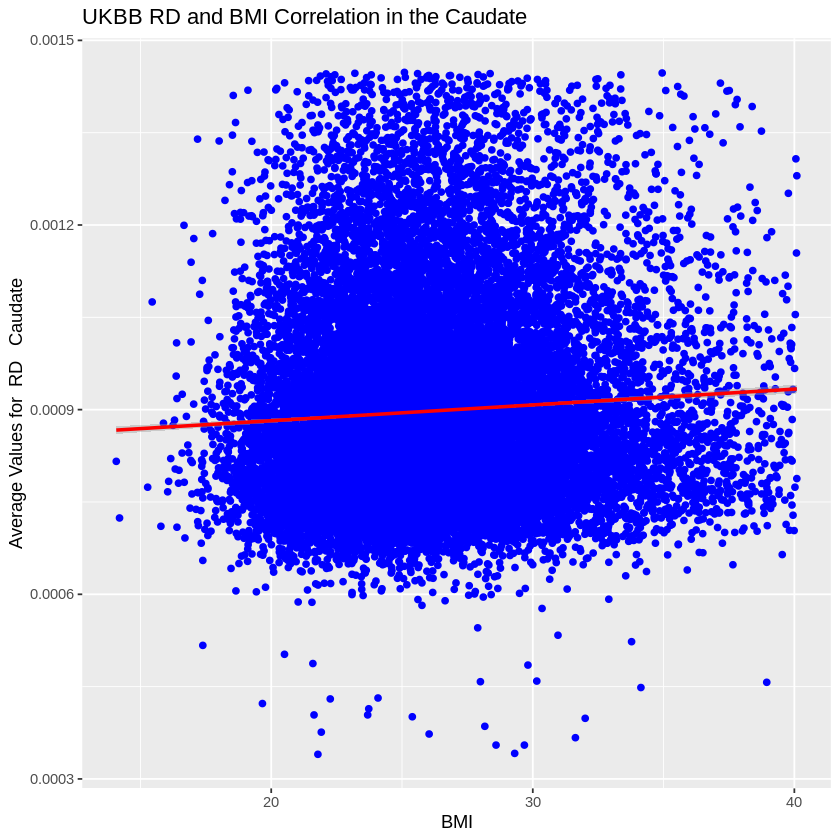

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 5168 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 5168 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


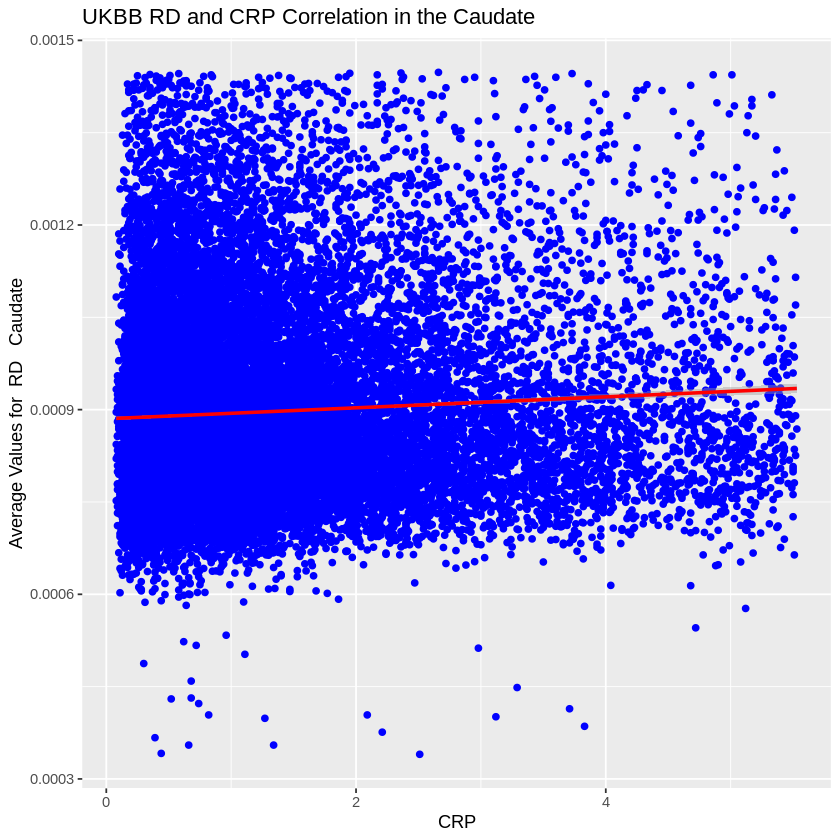

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2992 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2992 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


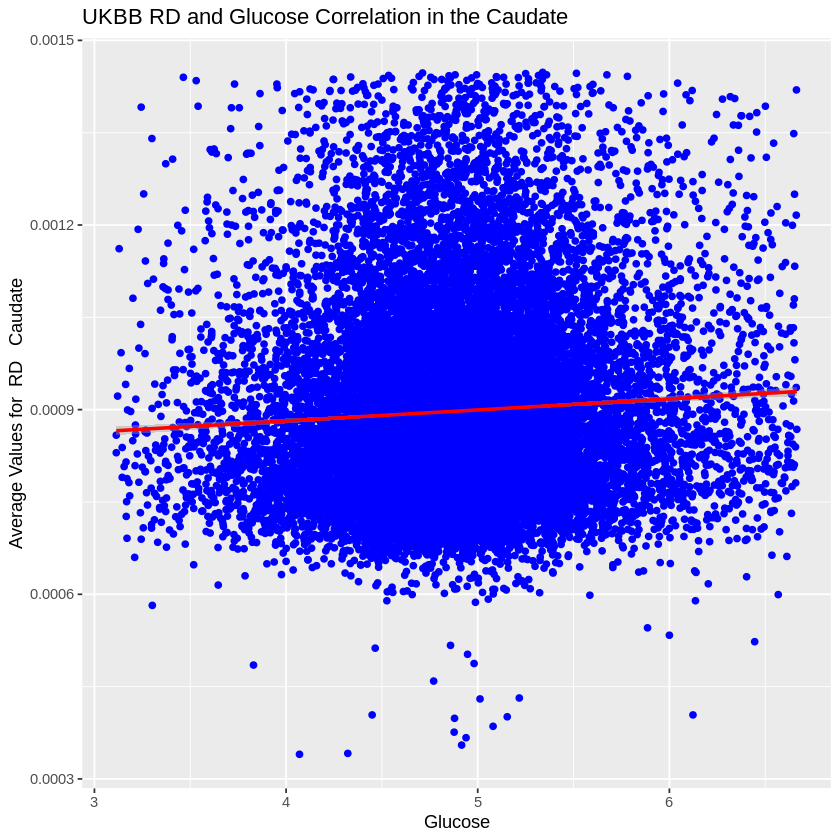

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2462 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2462 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


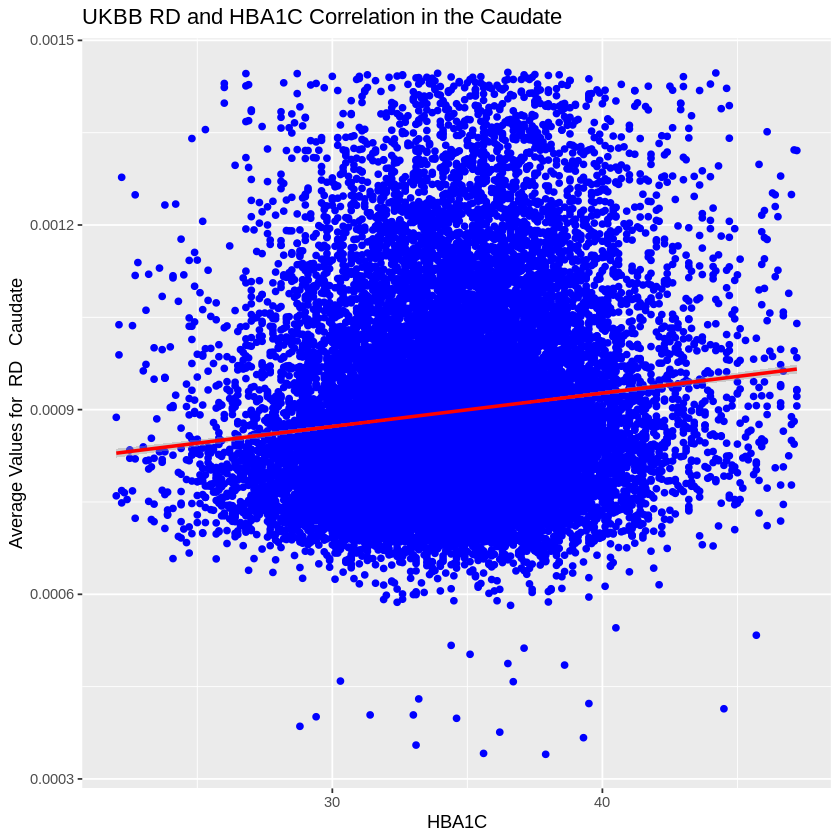

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 4602 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 4602 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


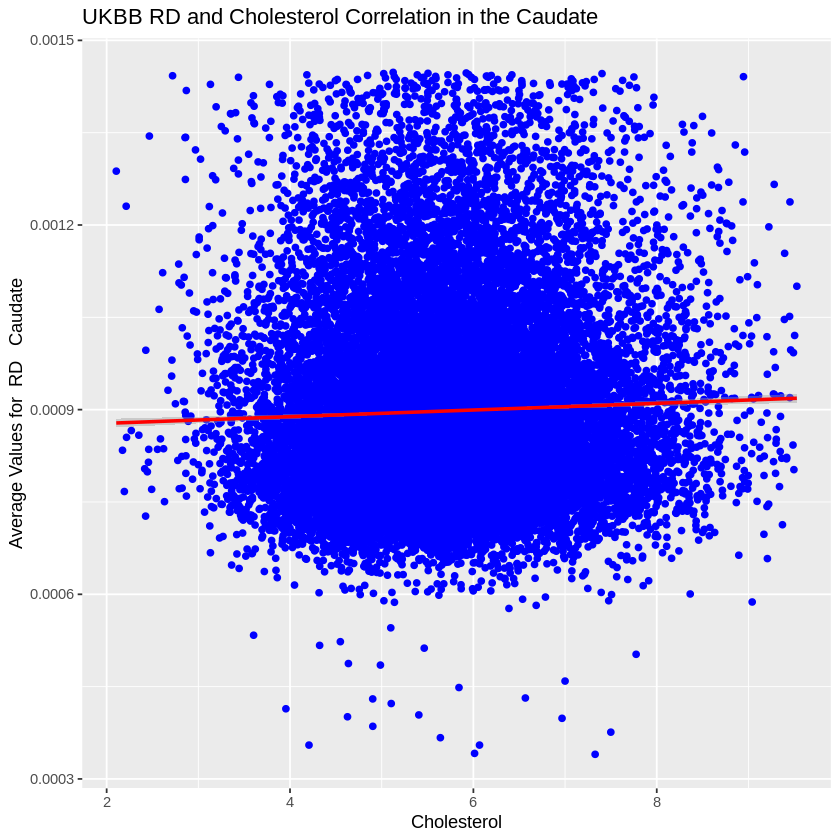

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2504 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2504 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


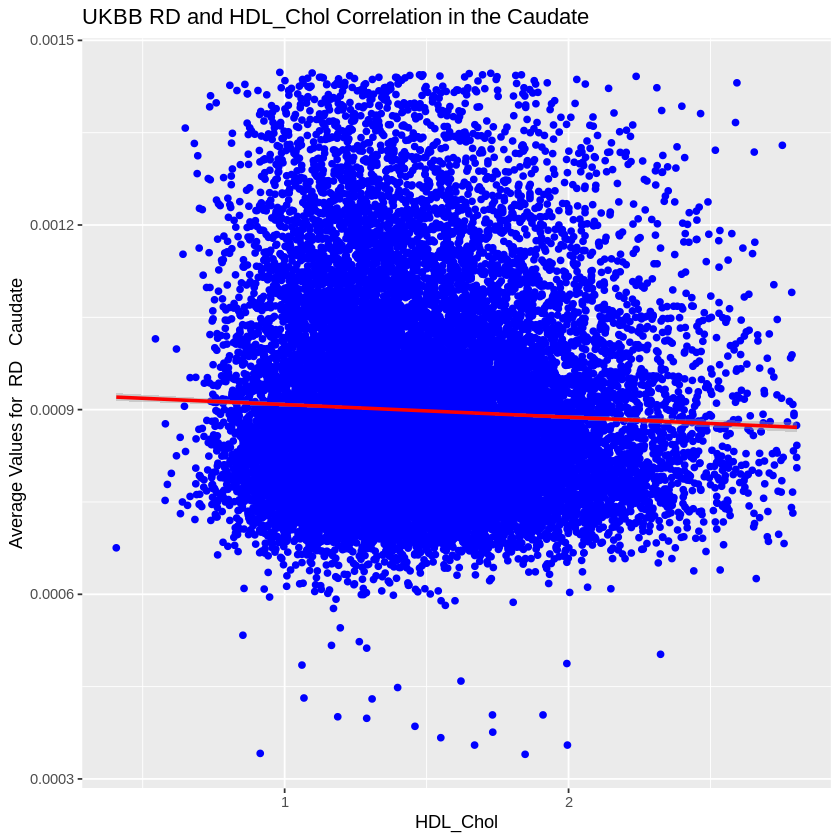

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2950 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2950 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


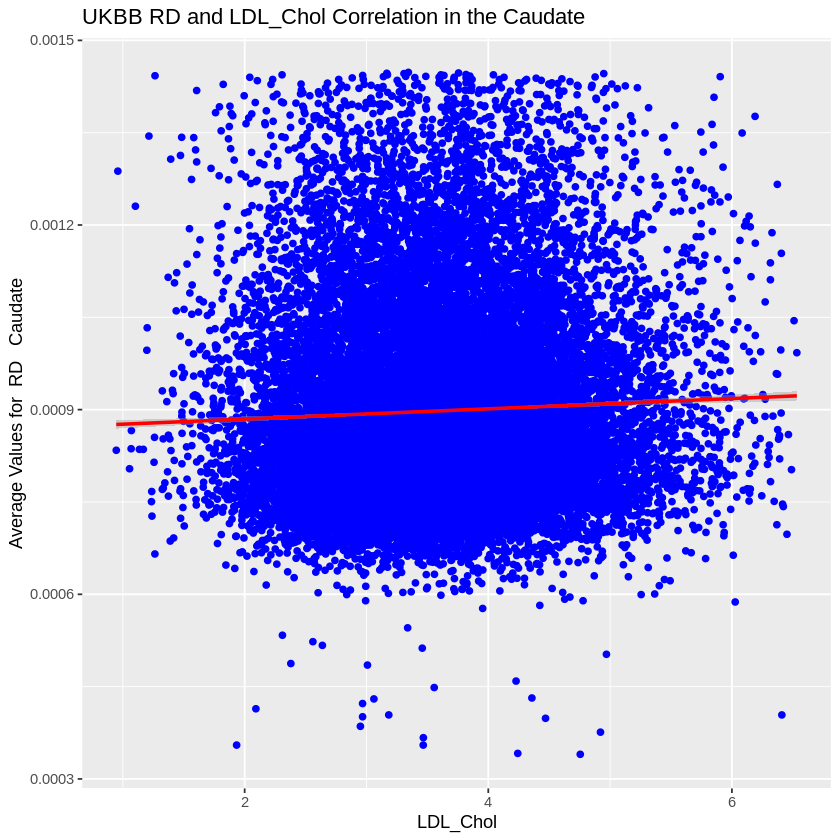

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2968 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2968 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


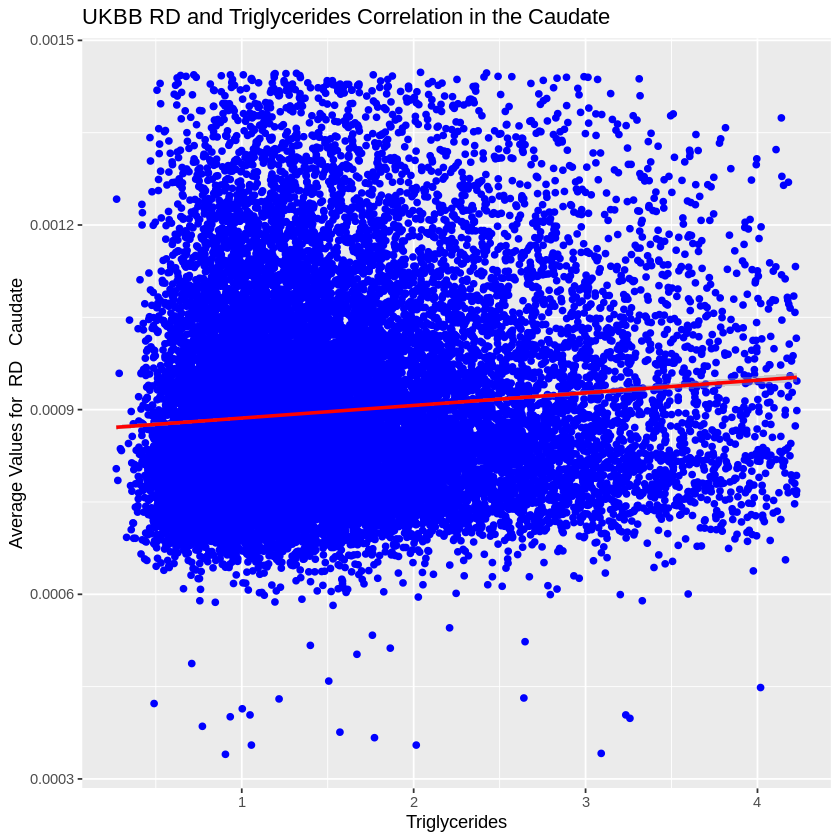

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2927 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2927 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


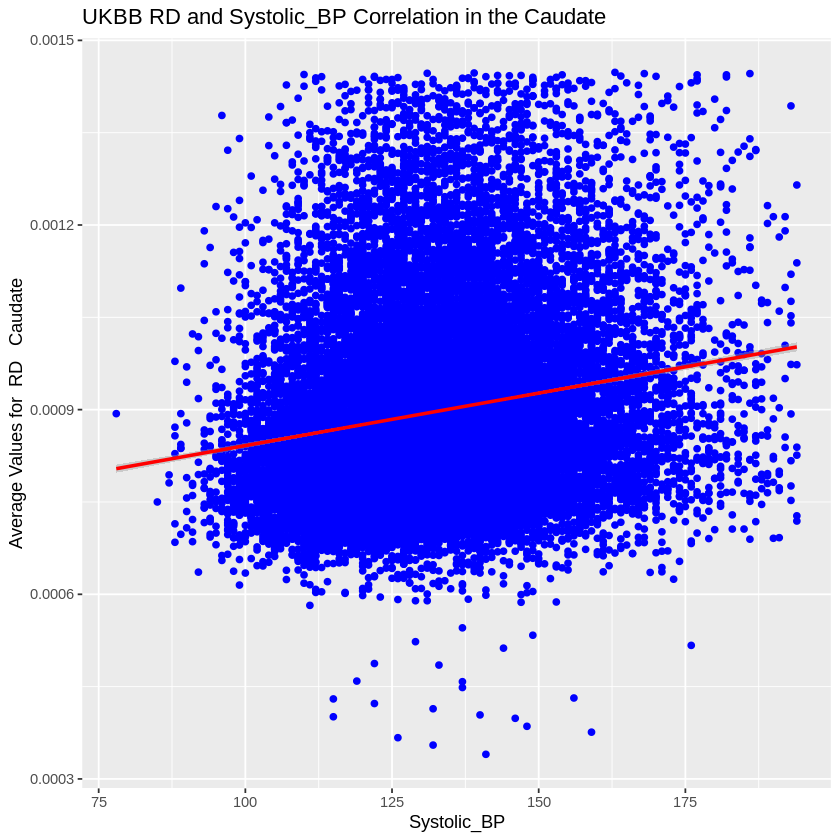

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2398 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2398 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


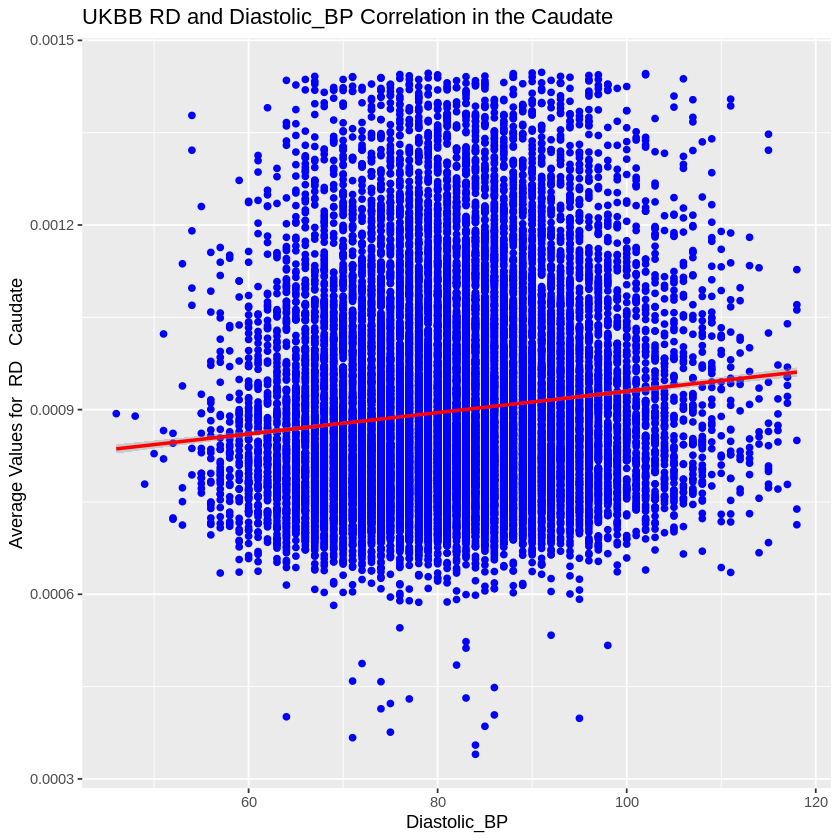

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 4436 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 4436 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


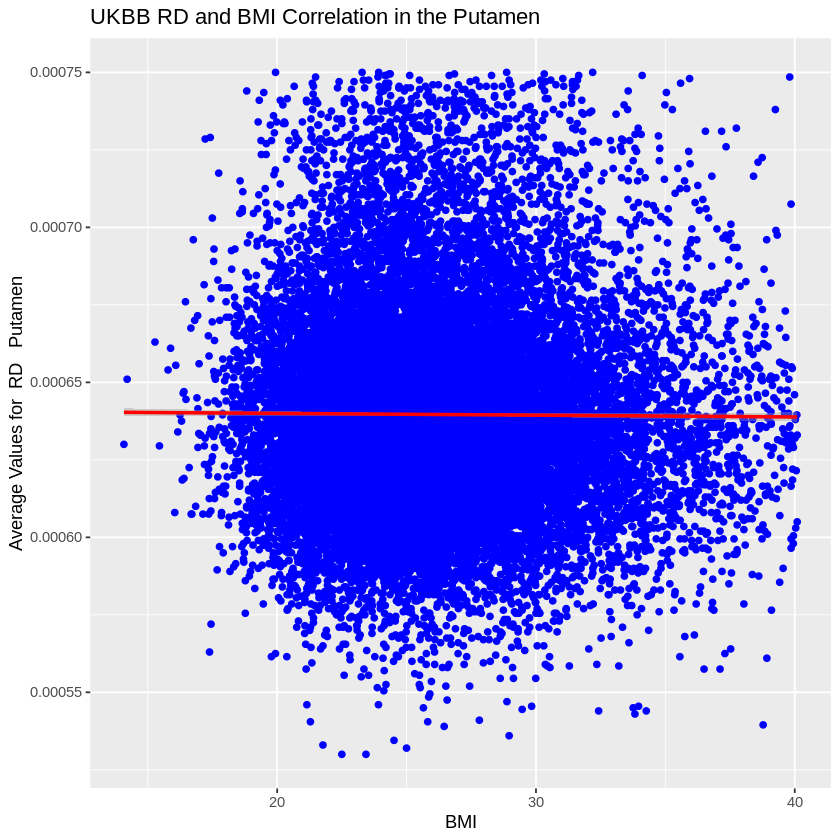

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 5622 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 5622 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


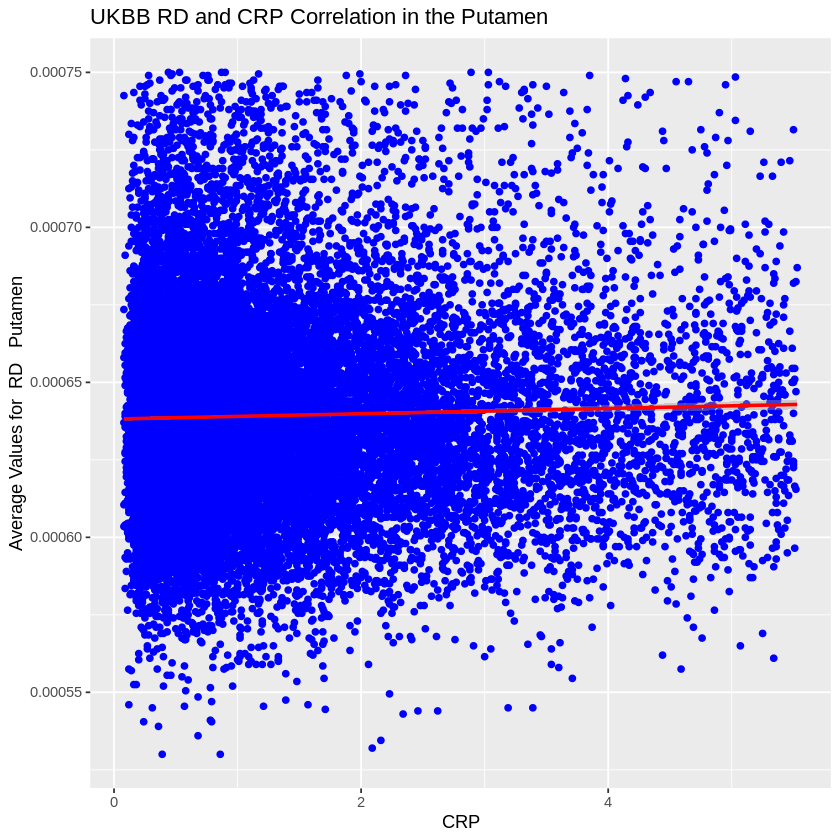

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3512 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3512 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


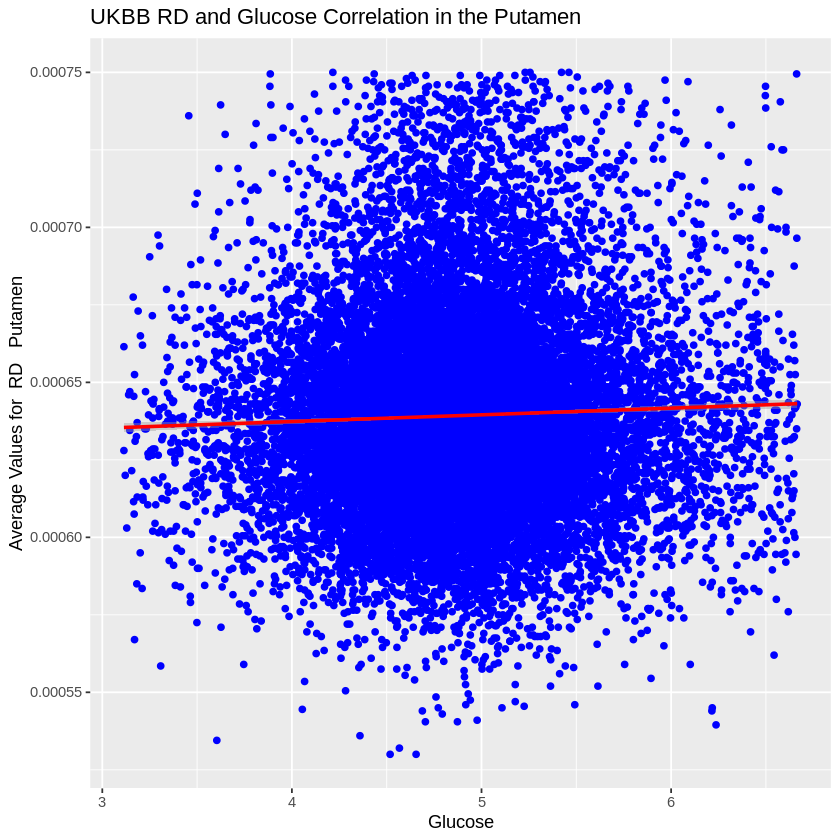

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2978 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2978 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


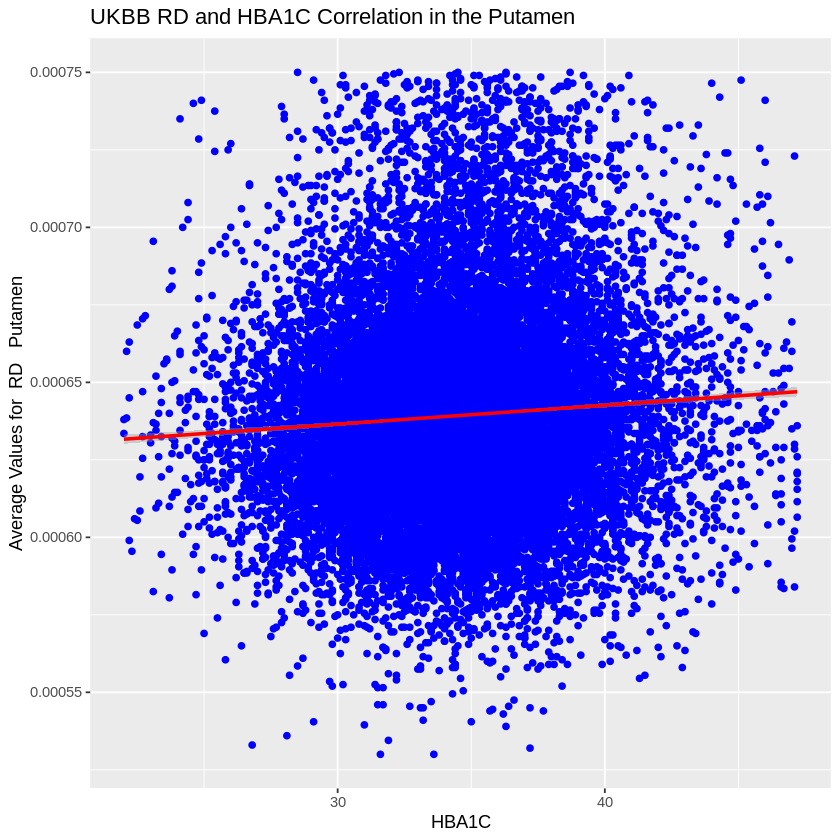

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 5058 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 5058 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


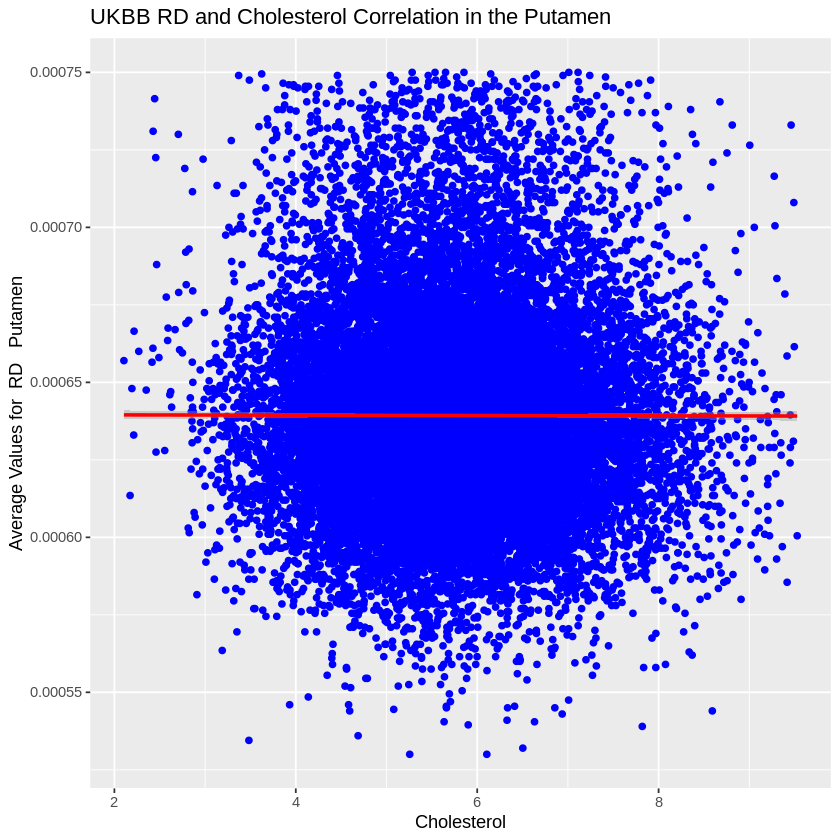

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3019 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3019 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


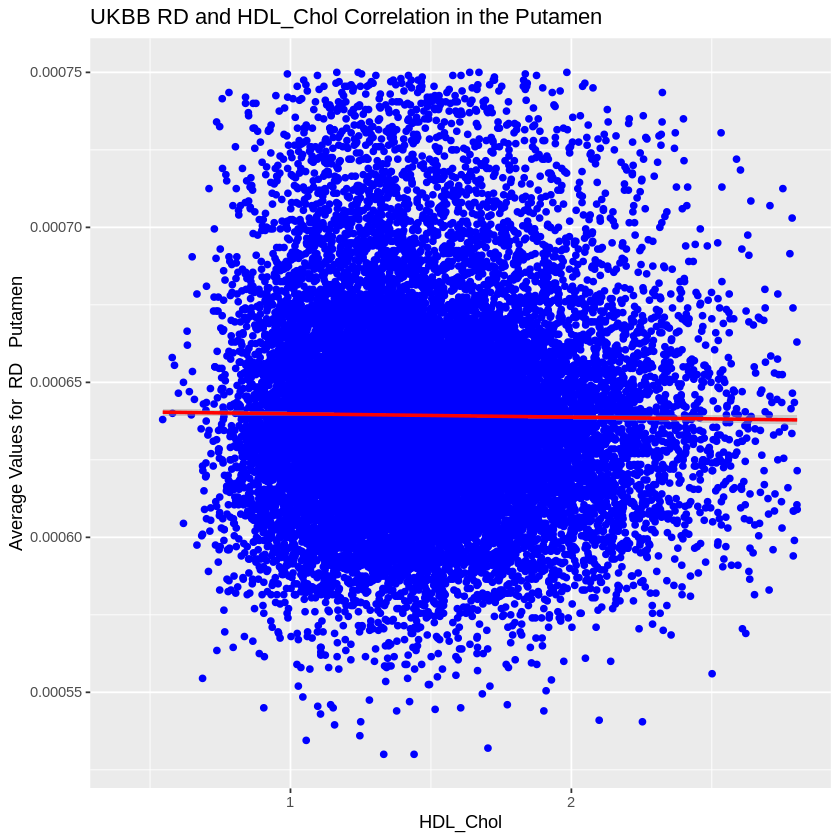

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3452 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3452 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


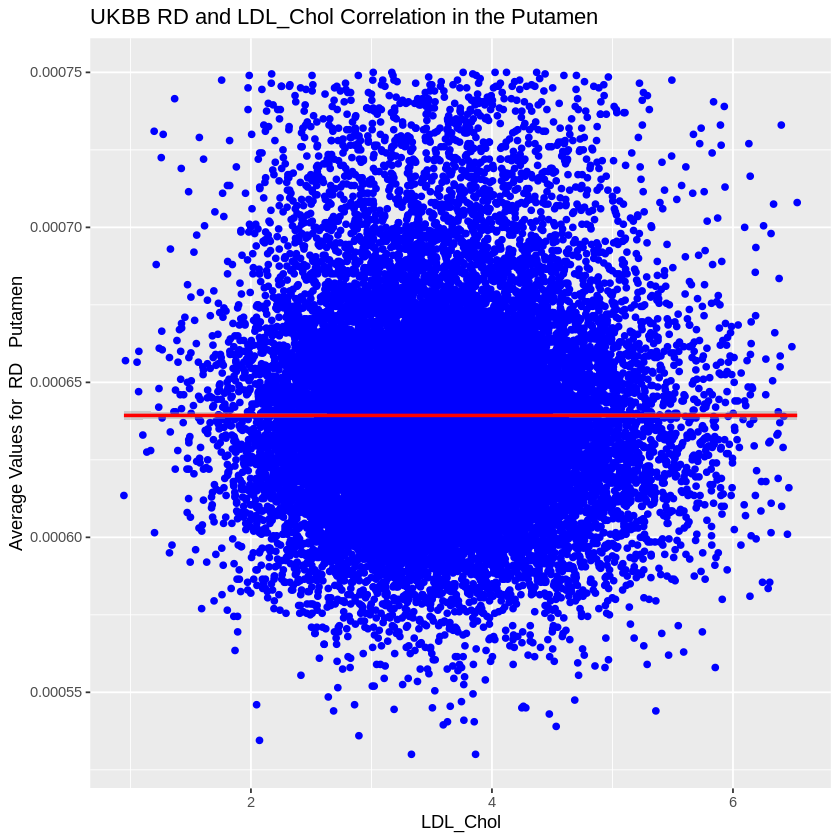

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3473 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3473 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


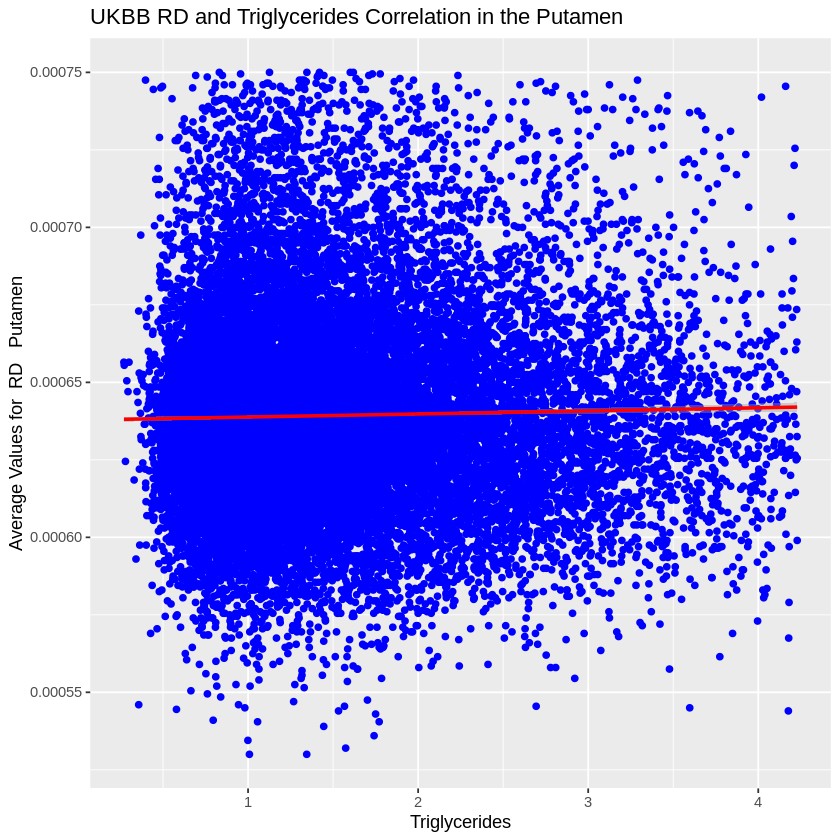

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3436 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3436 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


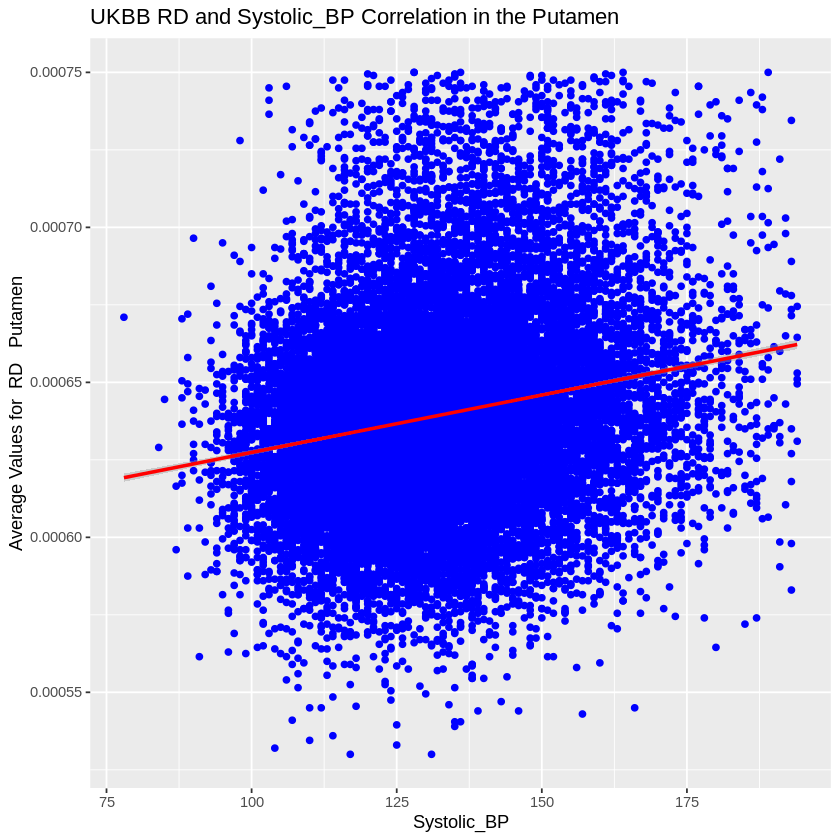

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2221 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2221 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


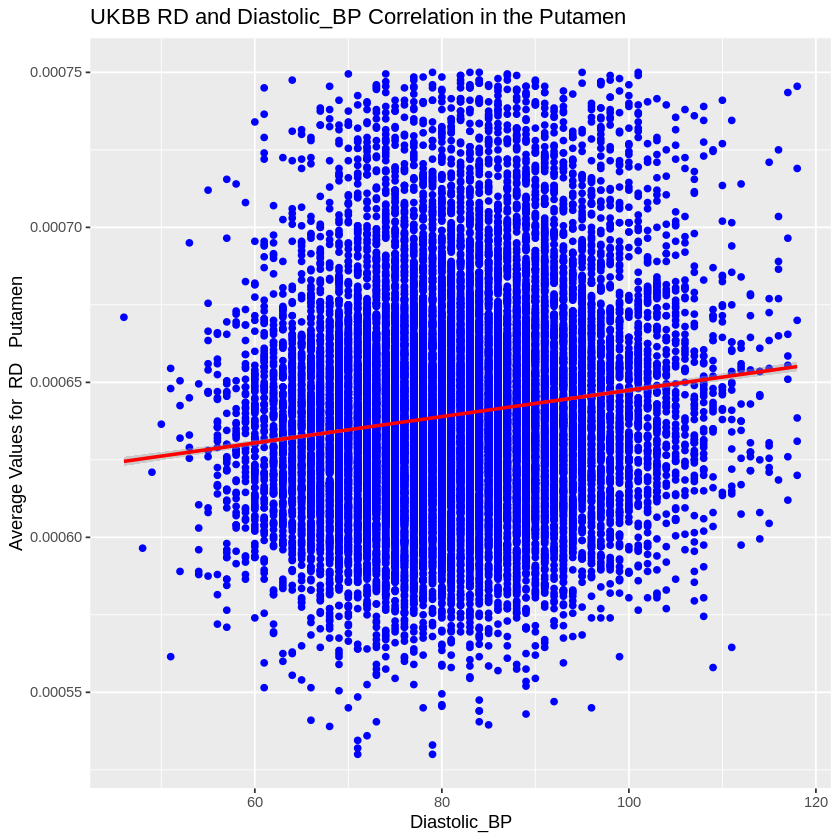

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 4298 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 4298 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


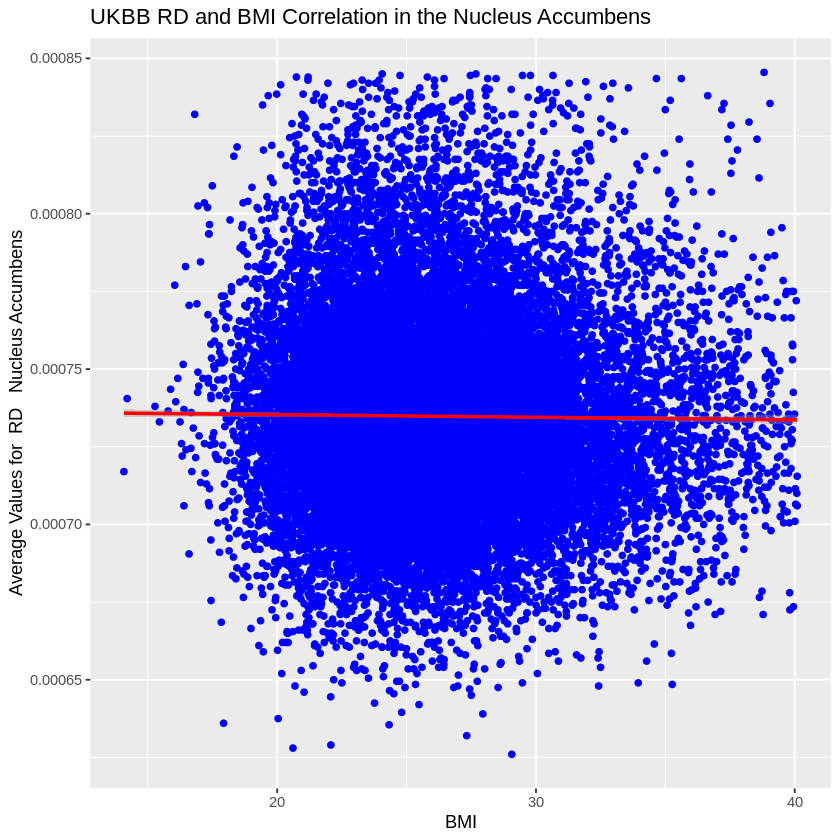

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 5490 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 5490 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


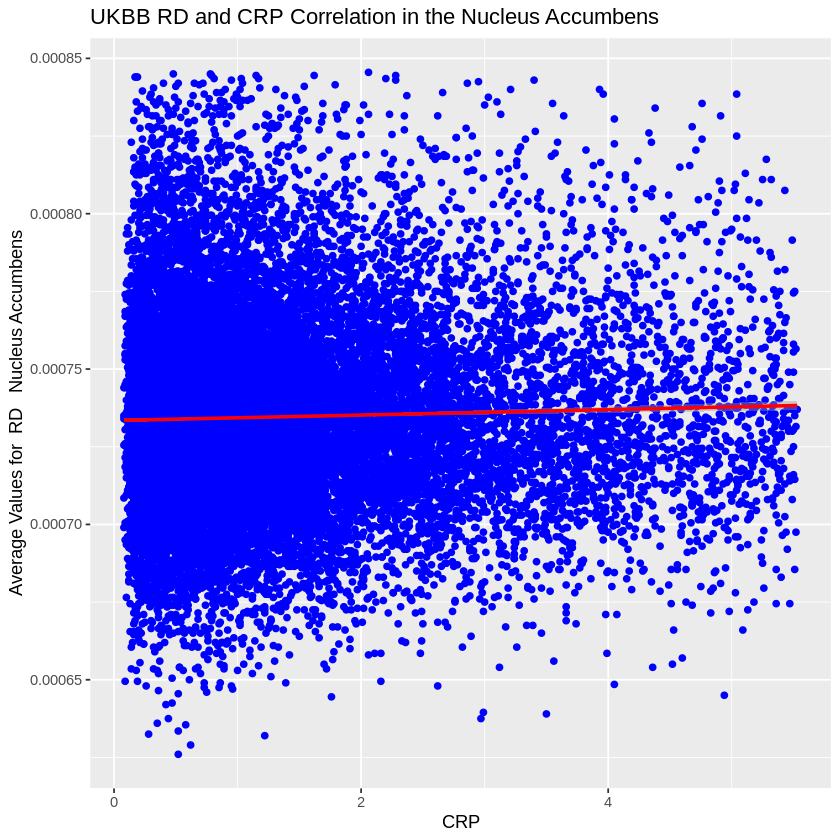

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3368 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3368 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


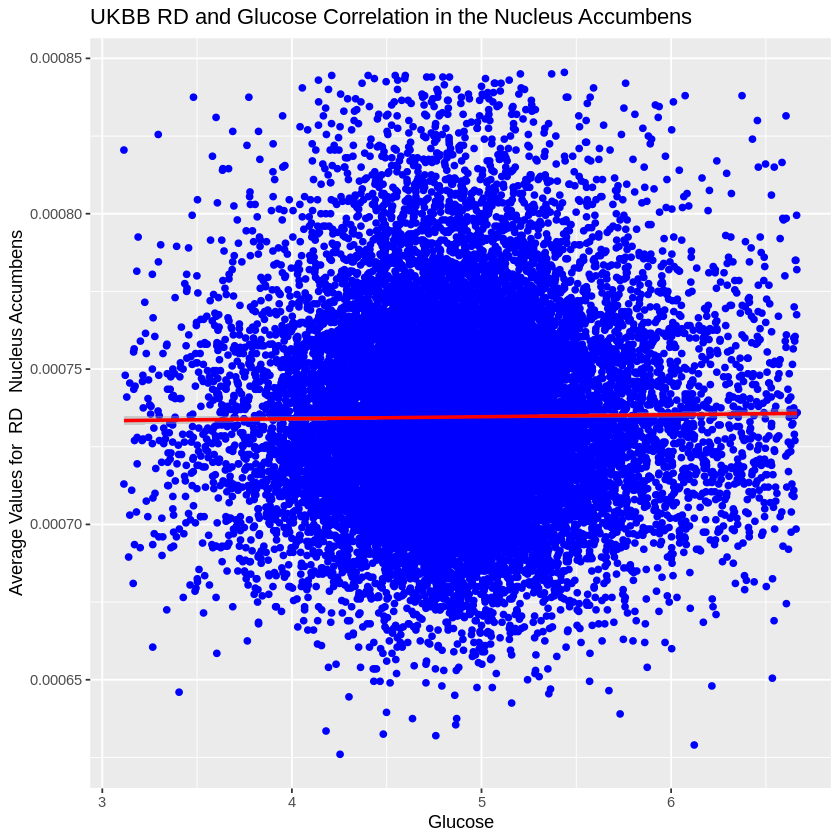

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2823 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2823 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


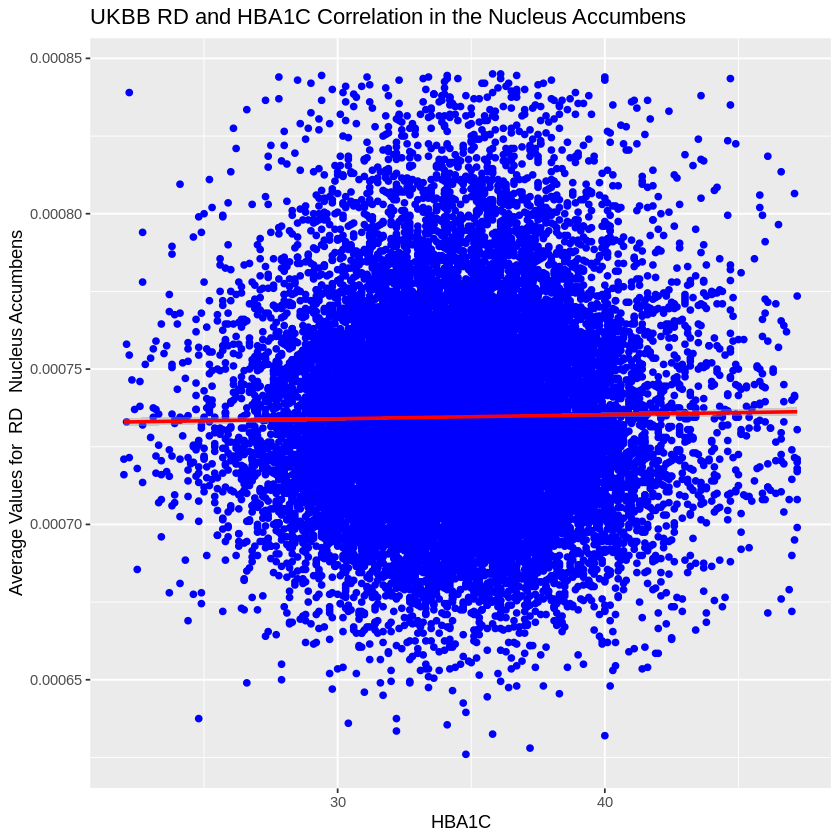

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 4923 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 4923 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


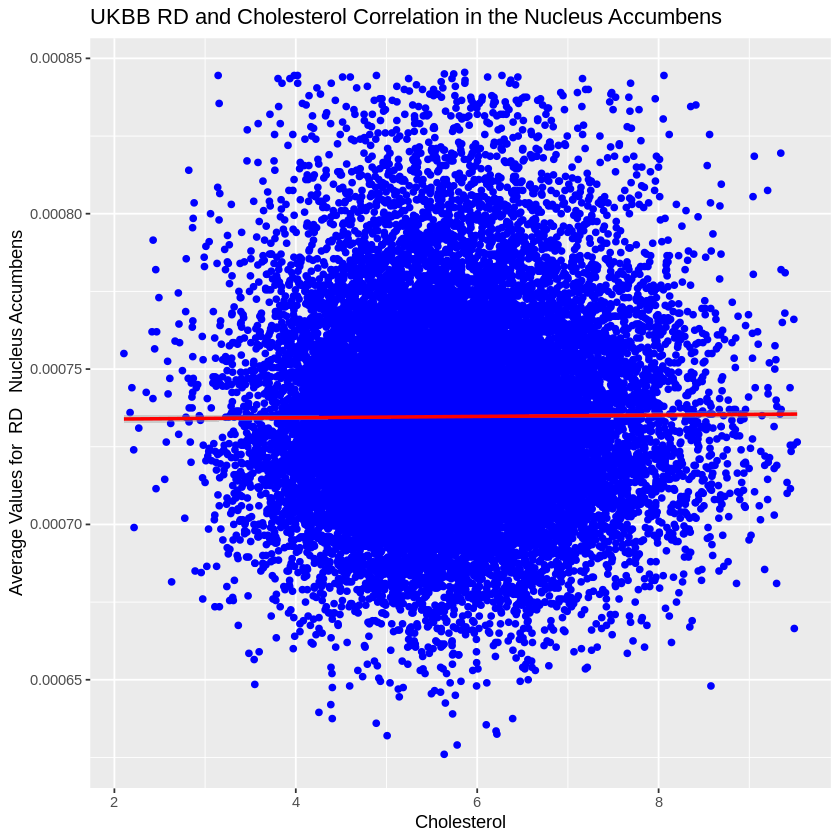

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2864 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2864 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


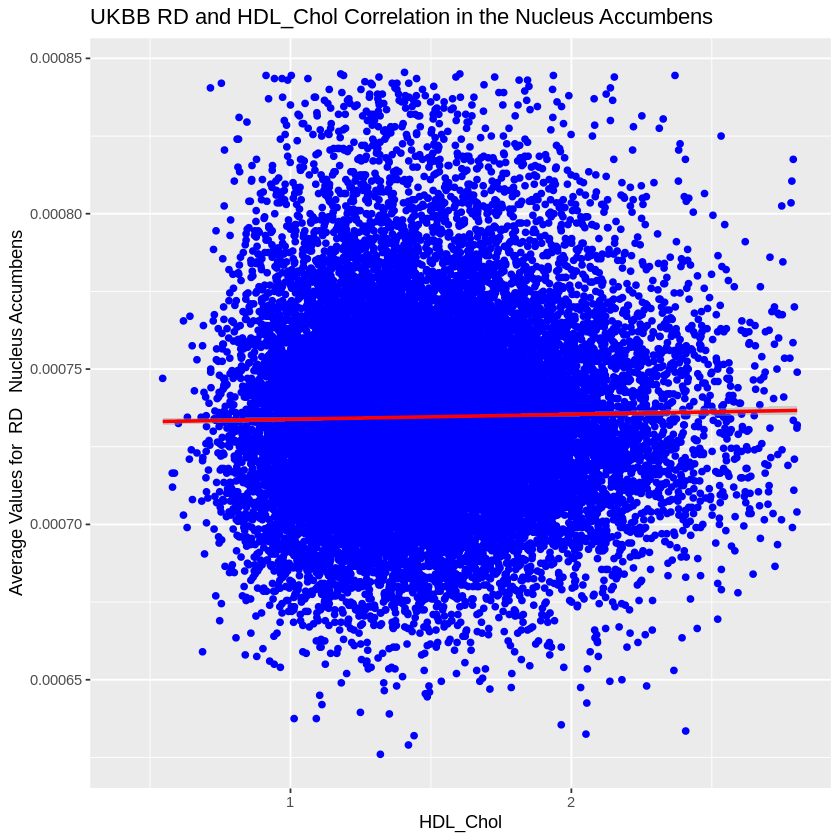

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3304 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3304 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


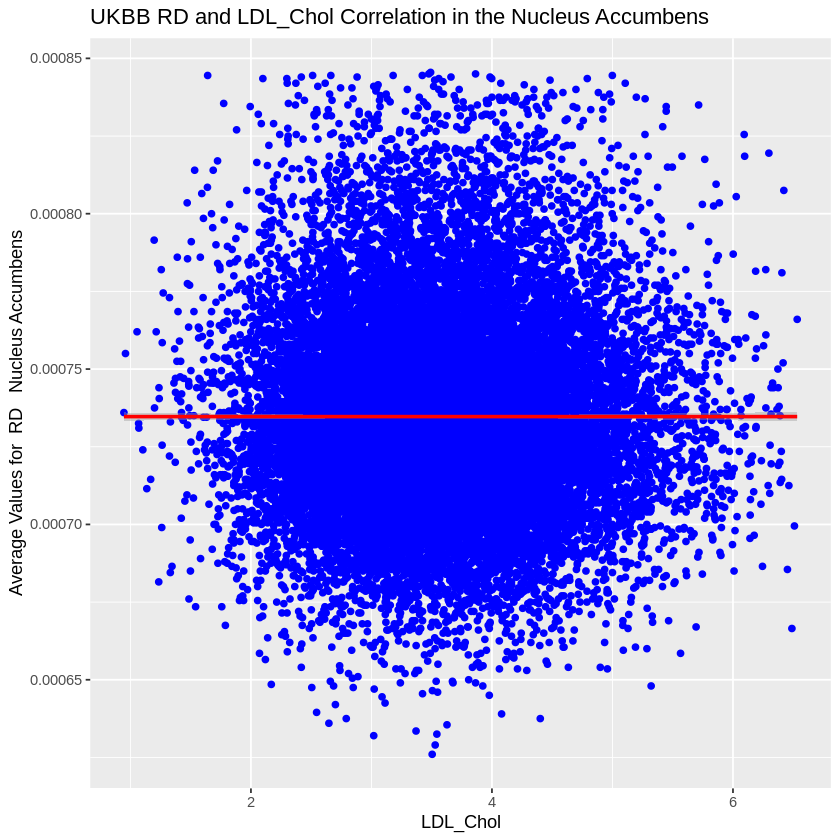

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3315 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3315 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


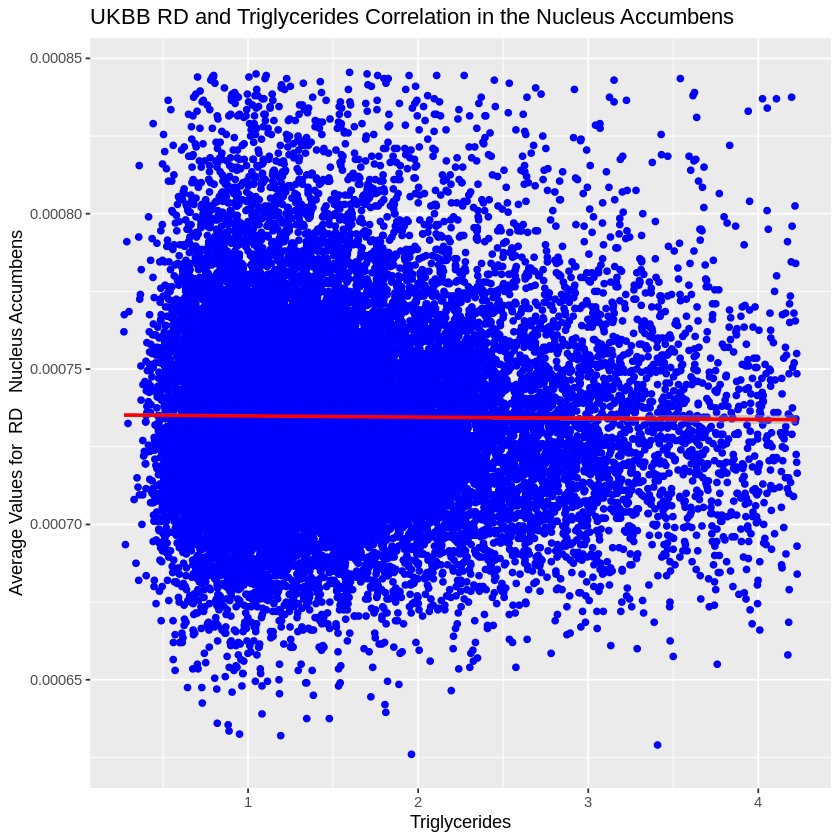

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3276 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3276 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


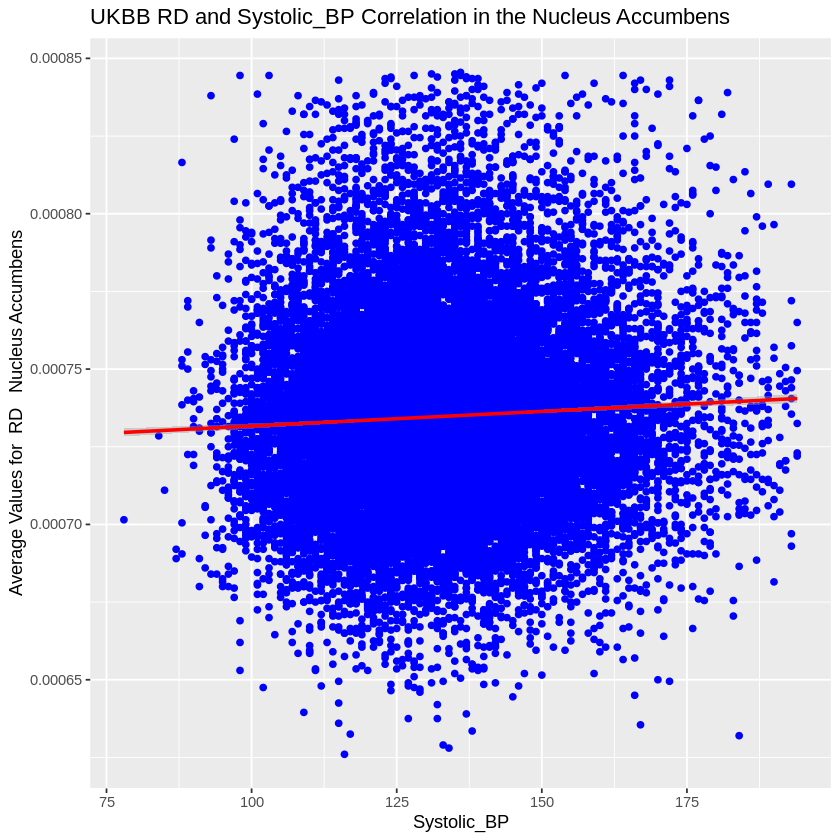

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 1749 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 1749 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


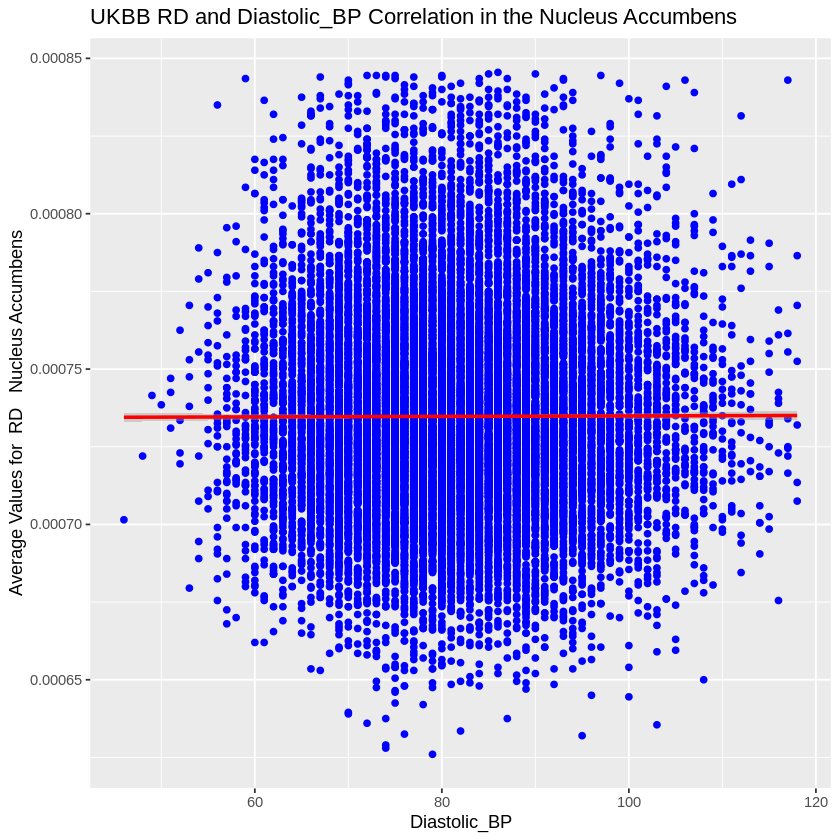

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3863 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3863 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


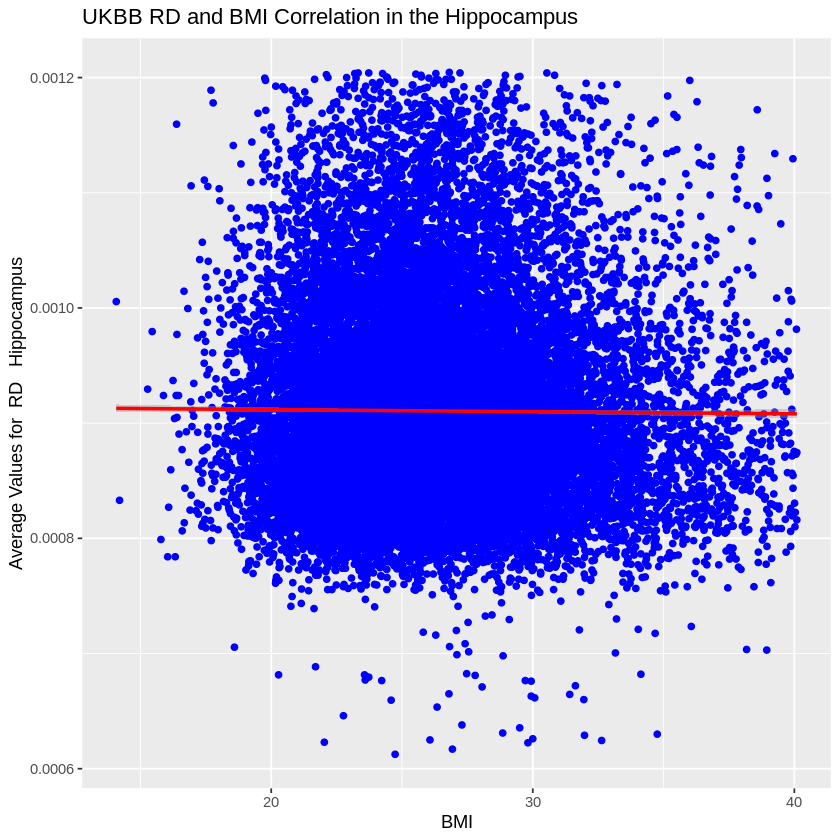

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 5081 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 5081 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


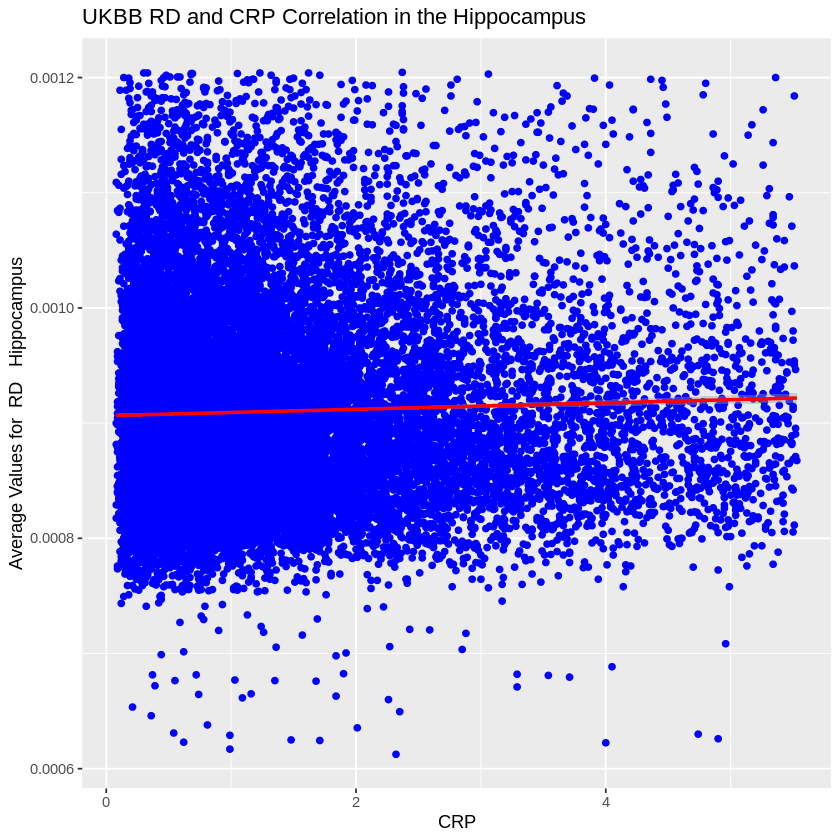

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2897 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2897 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


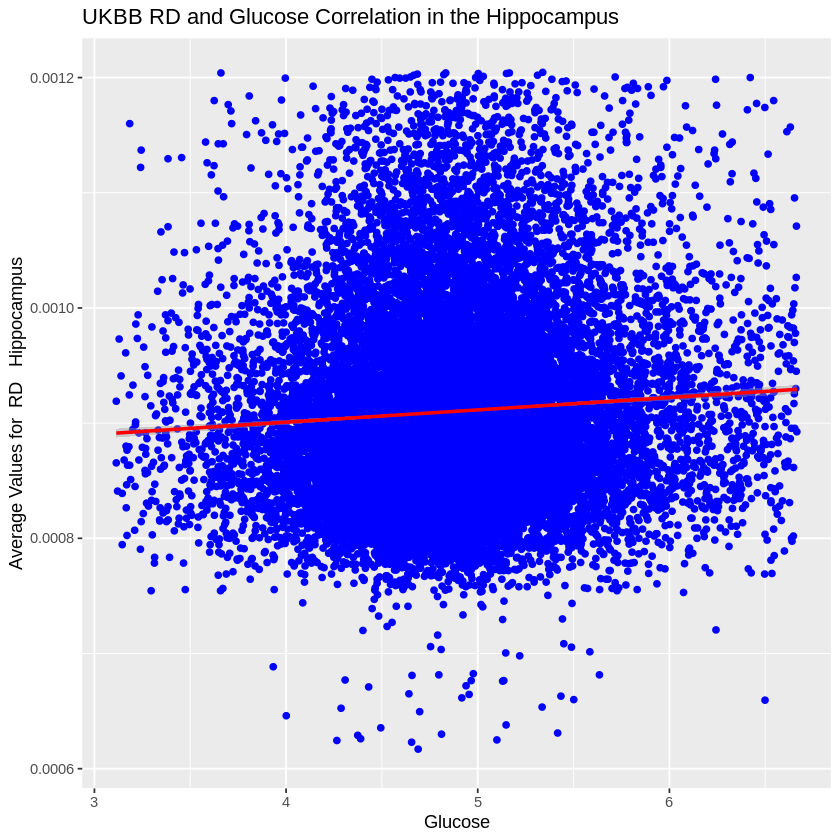

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2359 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2359 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


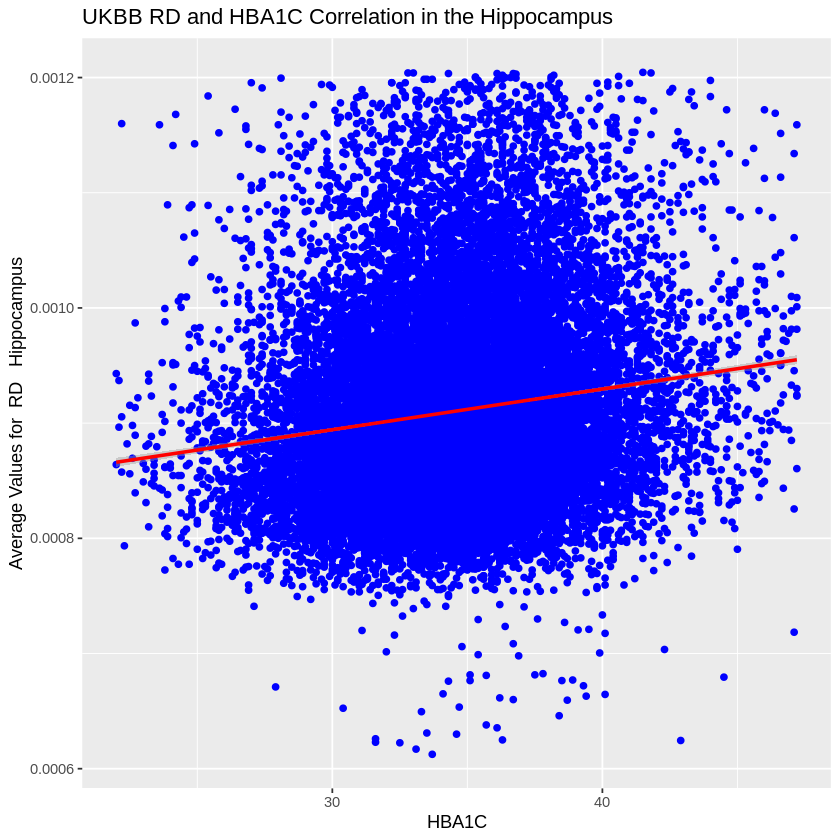

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 4504 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 4504 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


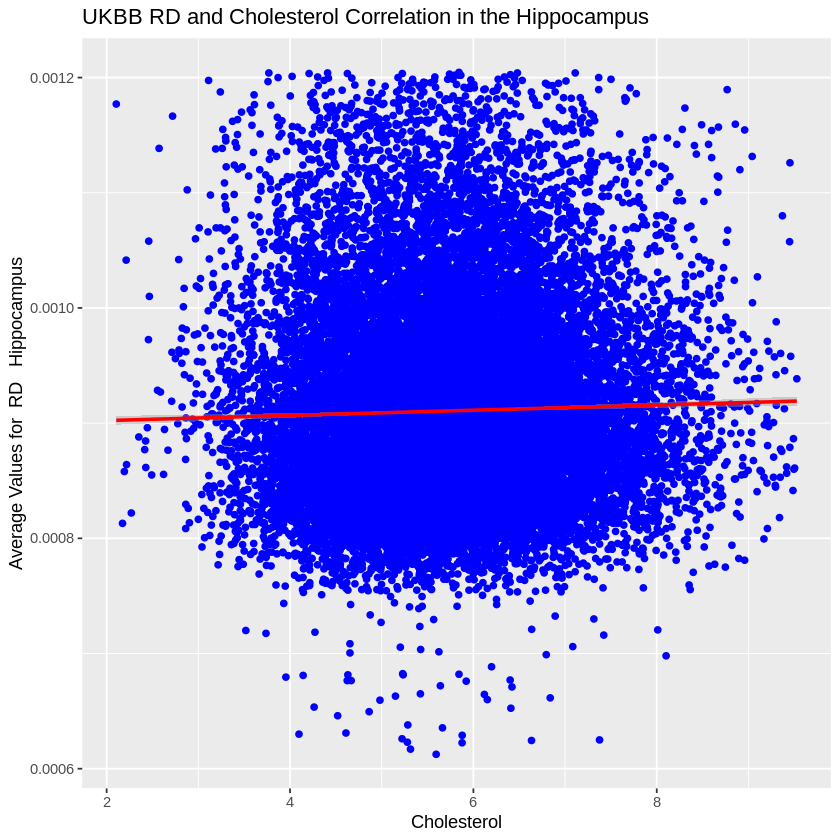

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2399 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2399 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


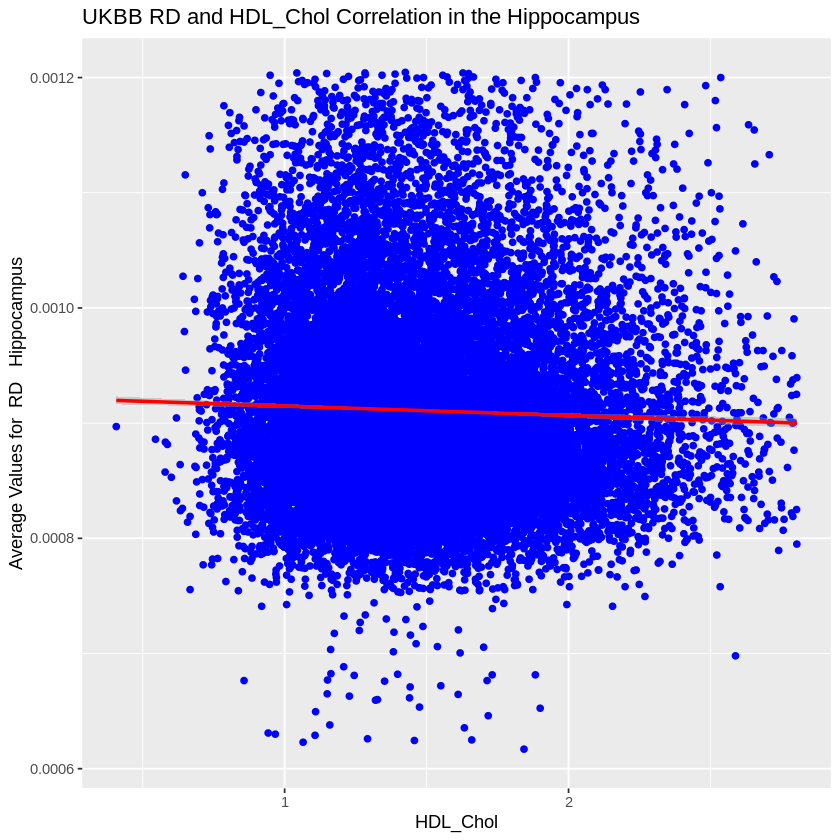

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2855 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2855 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


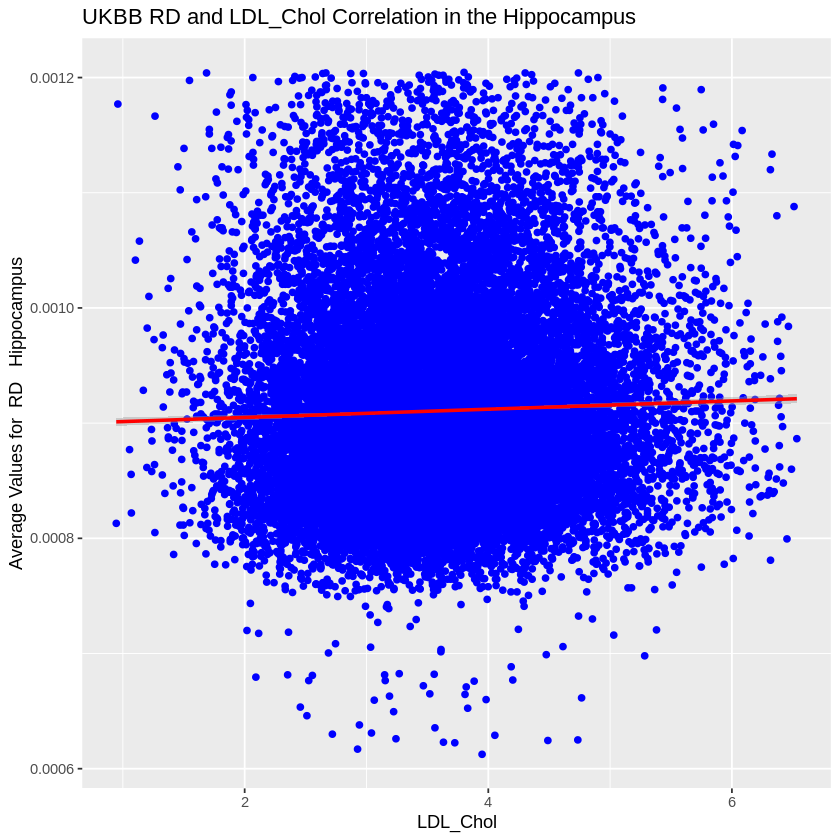

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2870 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2870 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


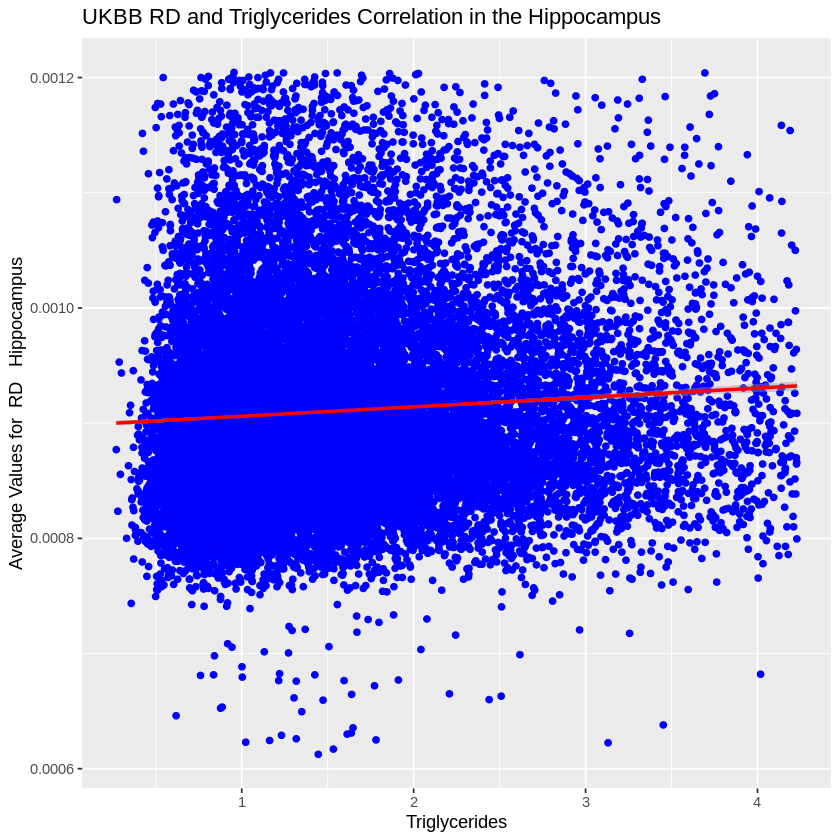

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2828 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2828 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


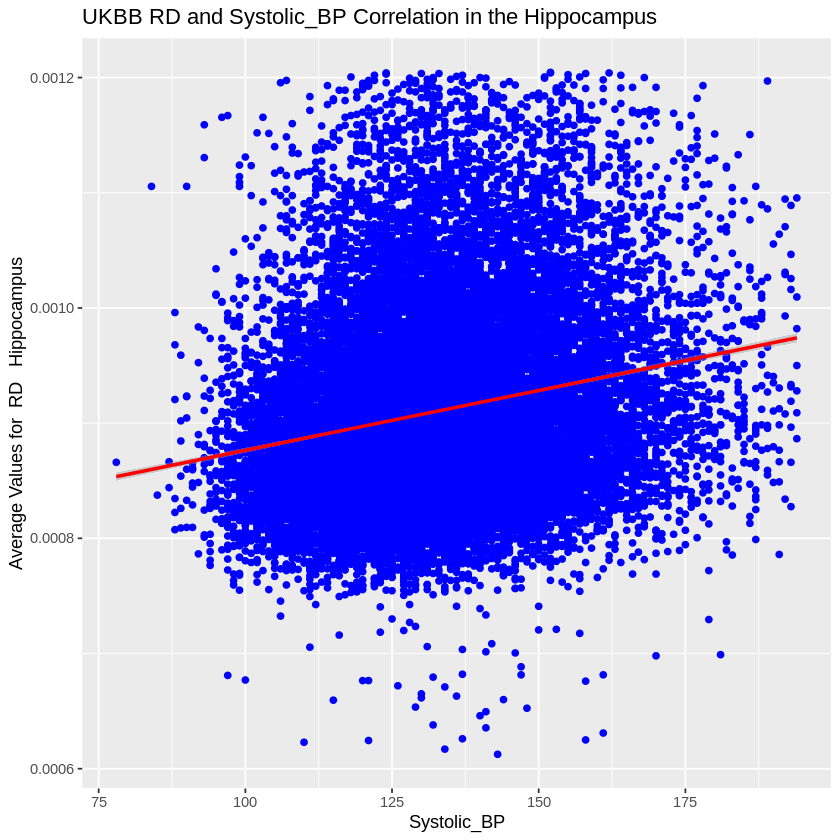

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2355 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2355 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


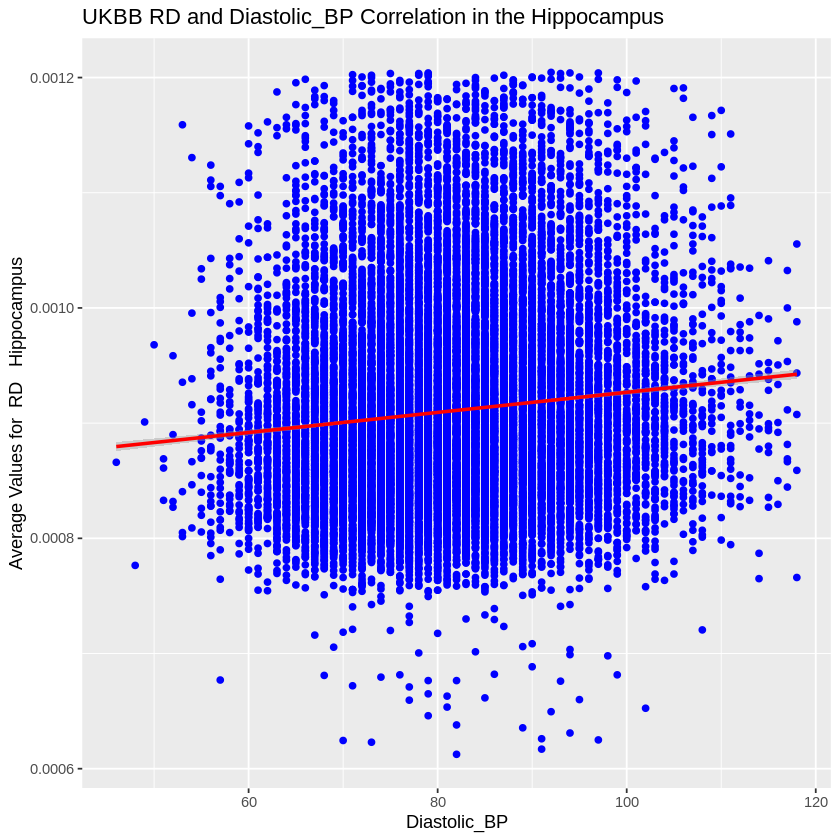

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 4423 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 4423 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


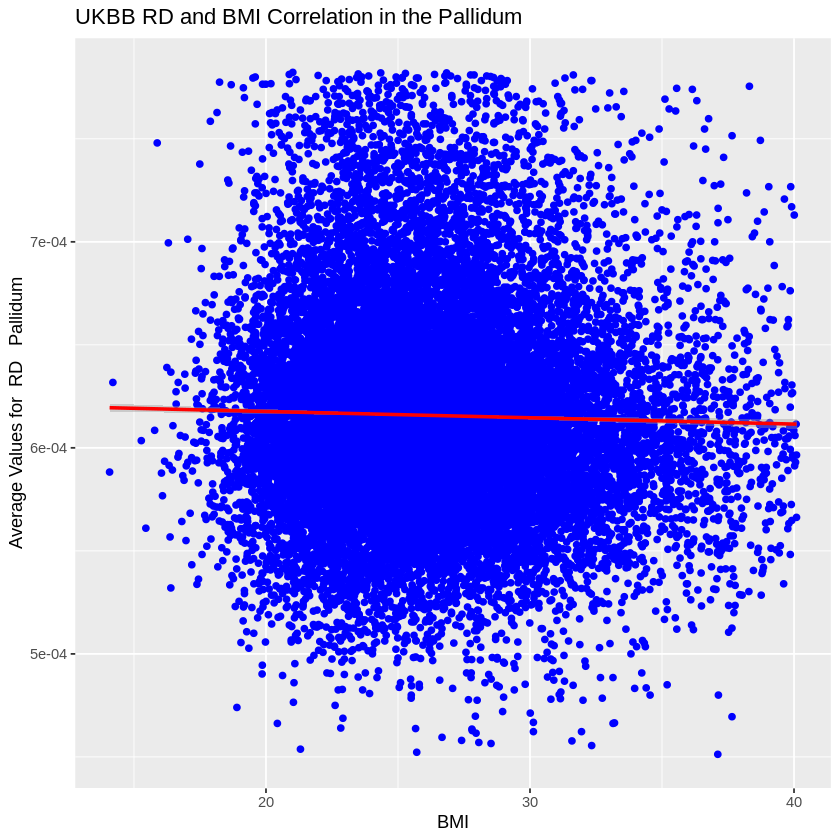

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 5615 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 5615 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


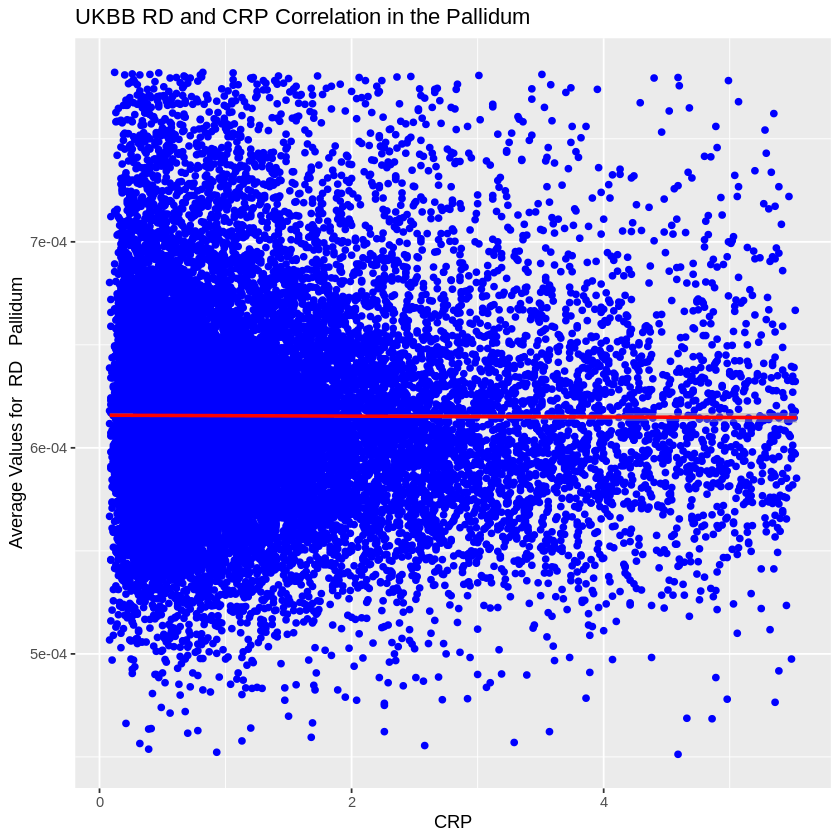

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3499 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3499 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


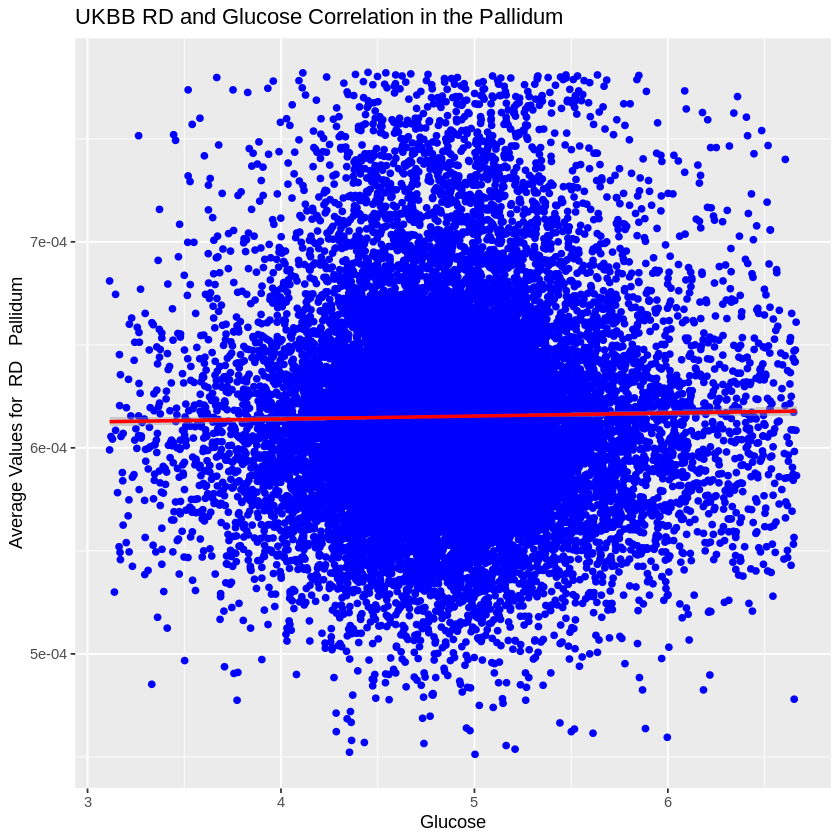

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2953 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2953 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


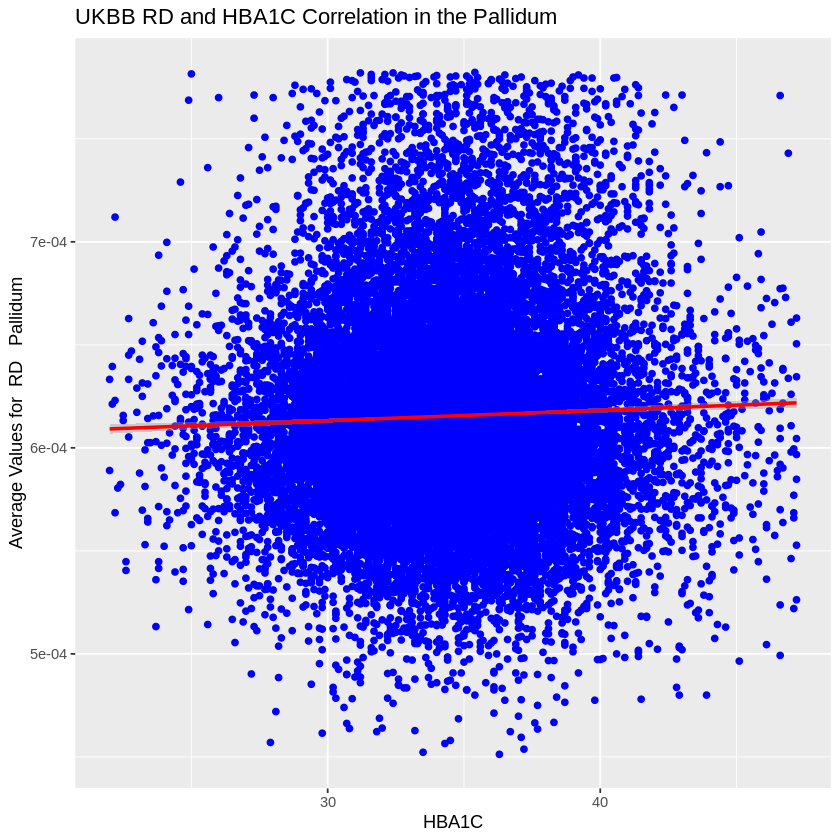

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 5052 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 5052 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


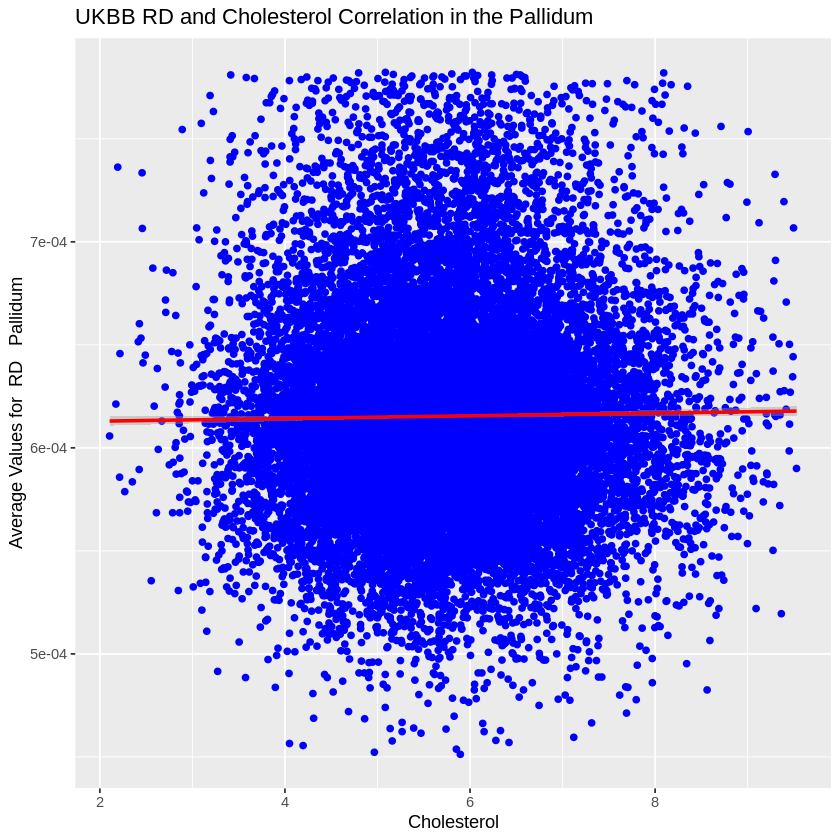

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2992 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2992 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


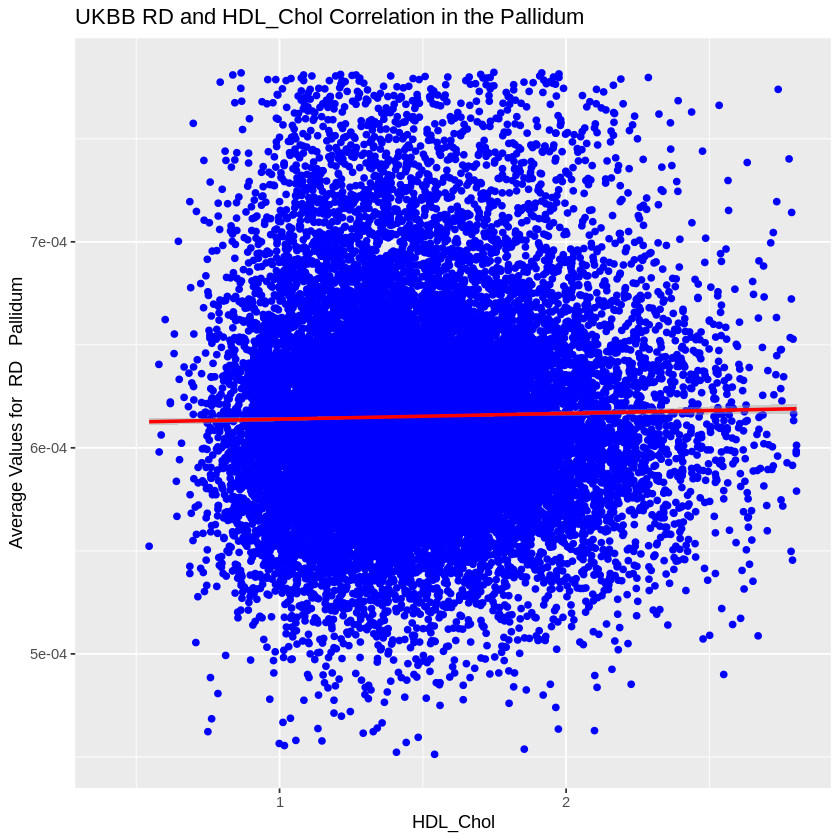

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3431 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3431 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


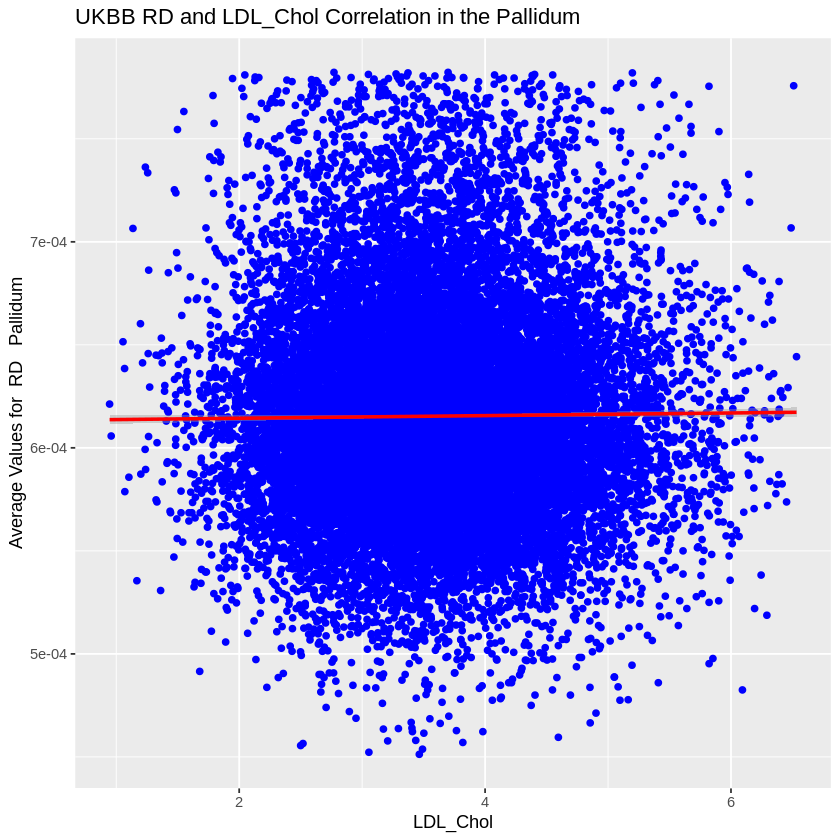

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3441 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3441 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


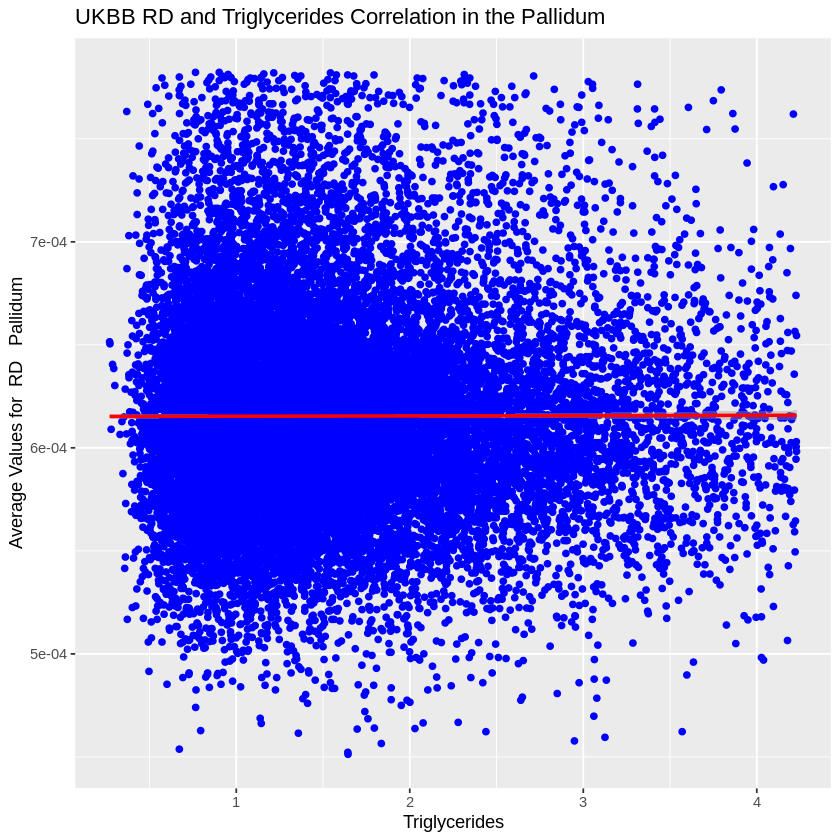

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3401 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3401 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


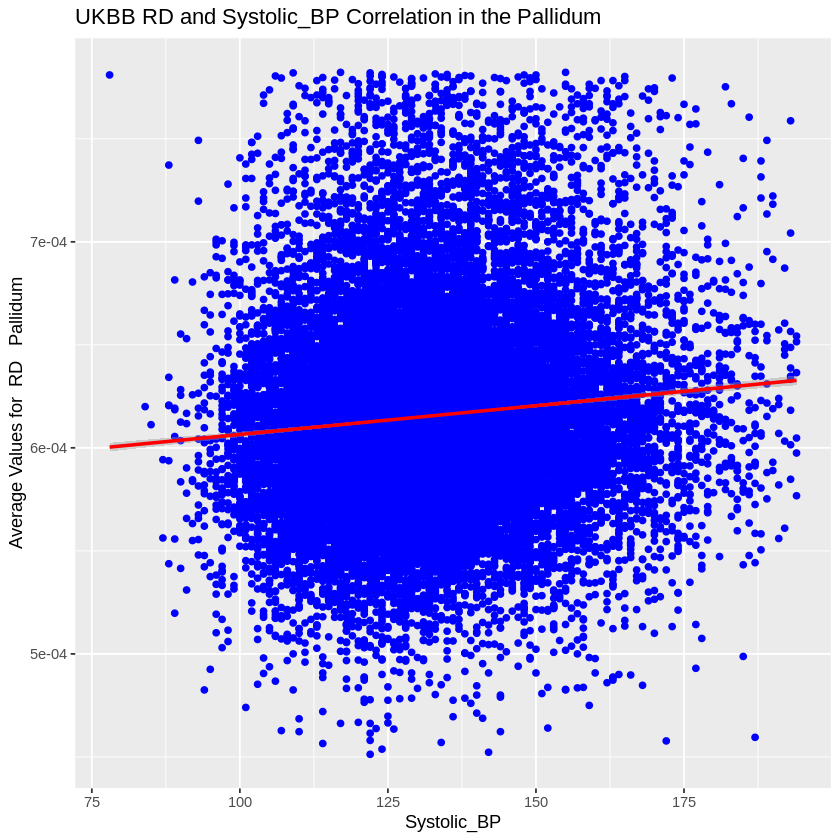

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 1738 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 1738 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


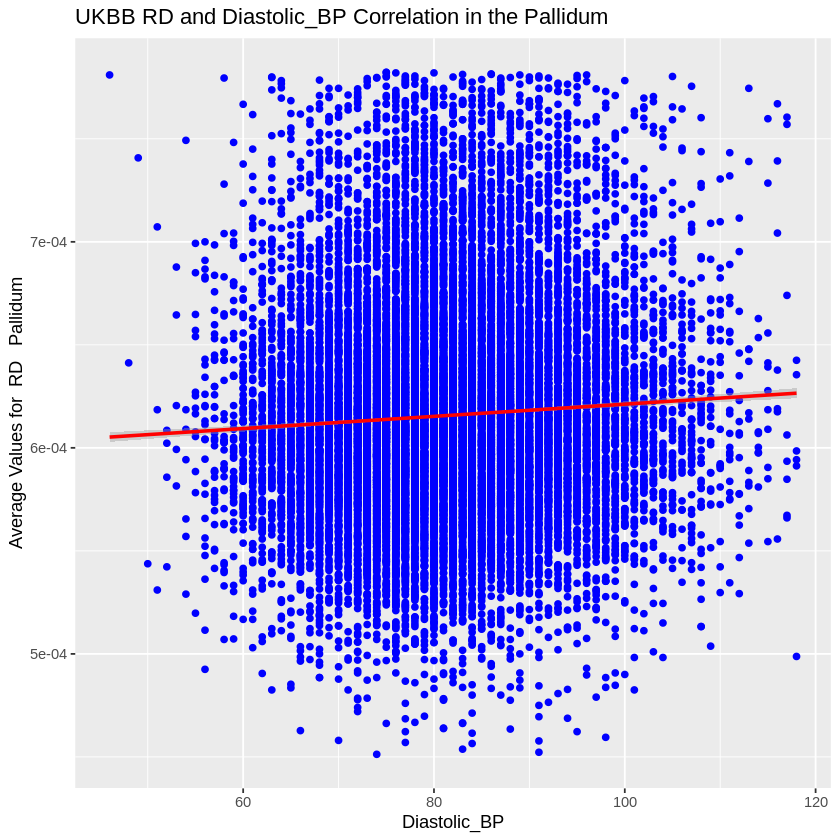

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 3847 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 3847 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


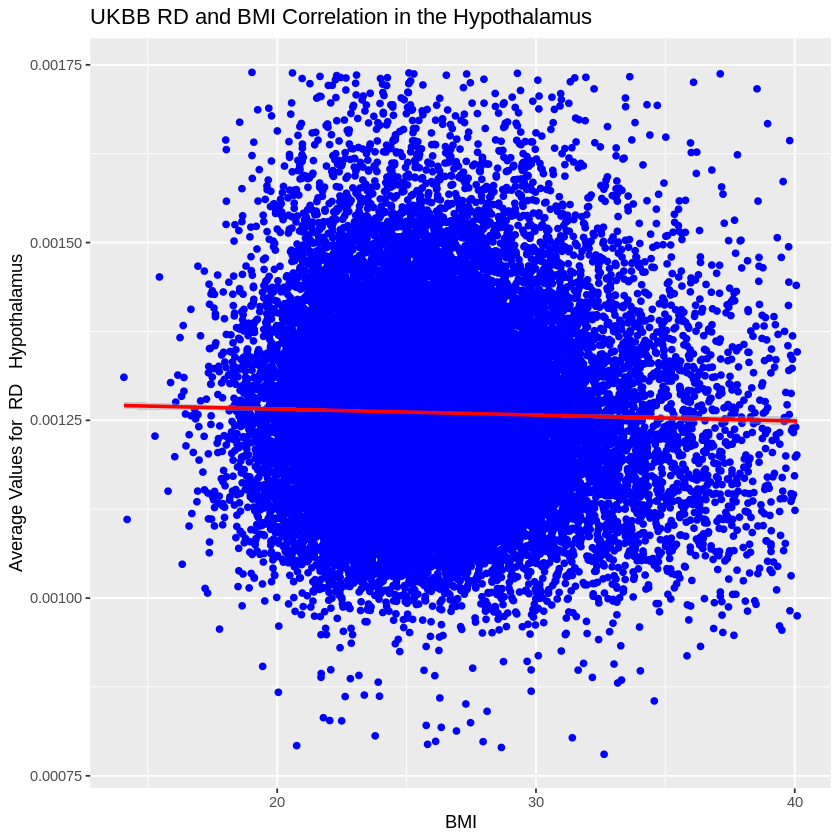

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 5065 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 5065 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


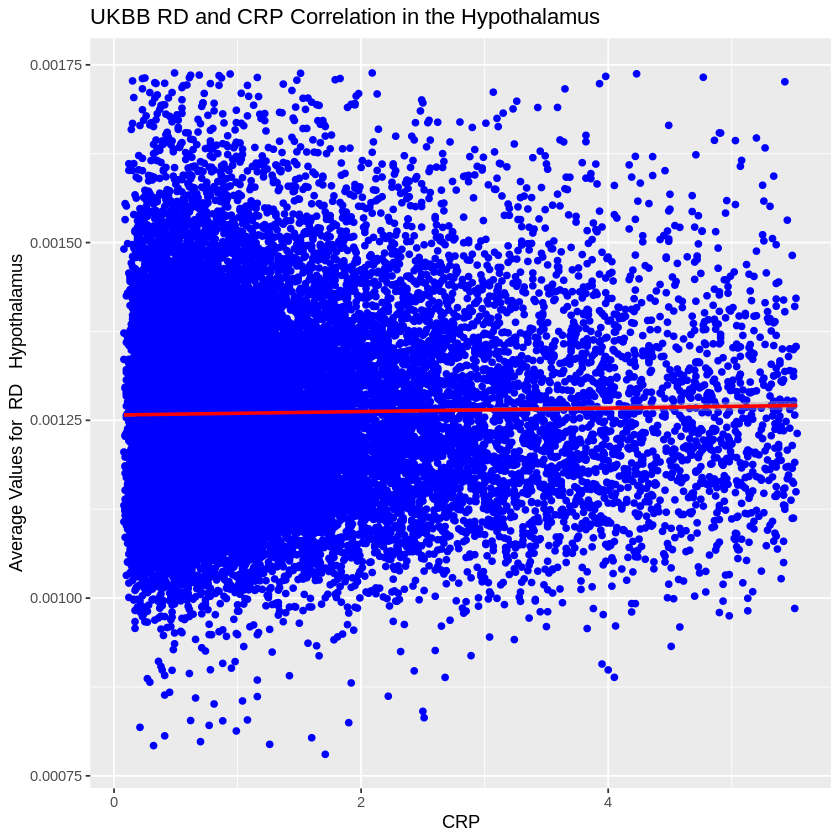

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2901 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2901 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


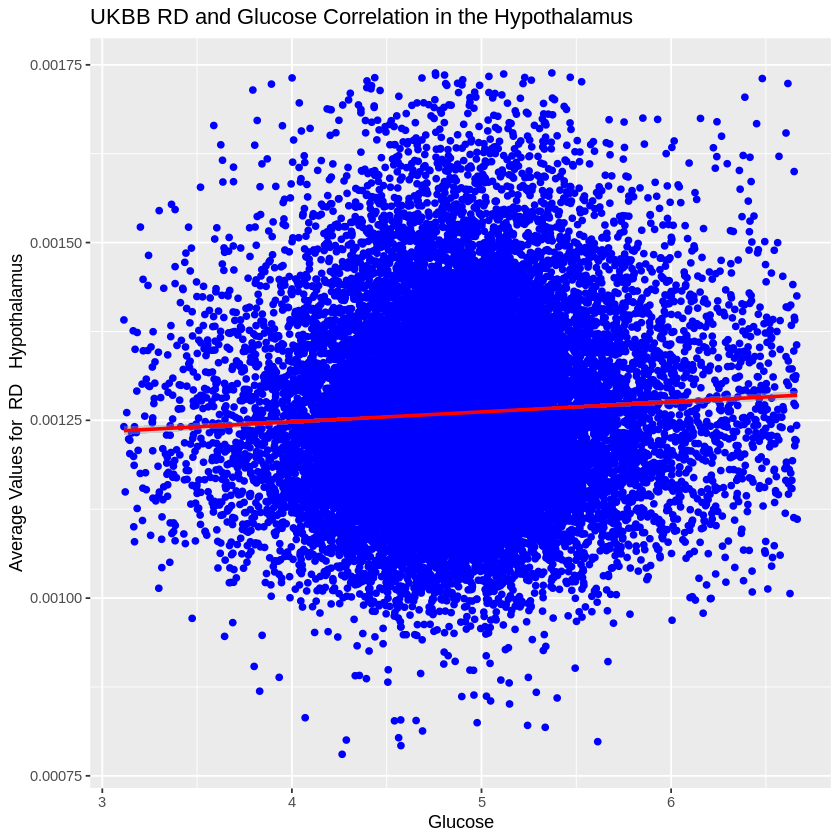

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2343 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2343 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


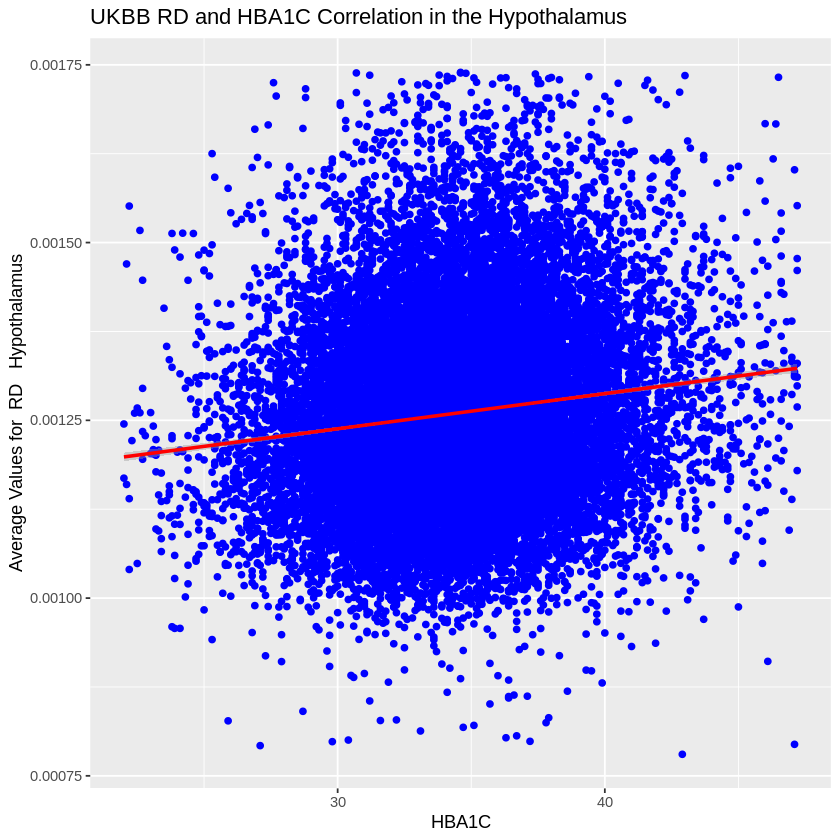

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 4483 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 4483 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


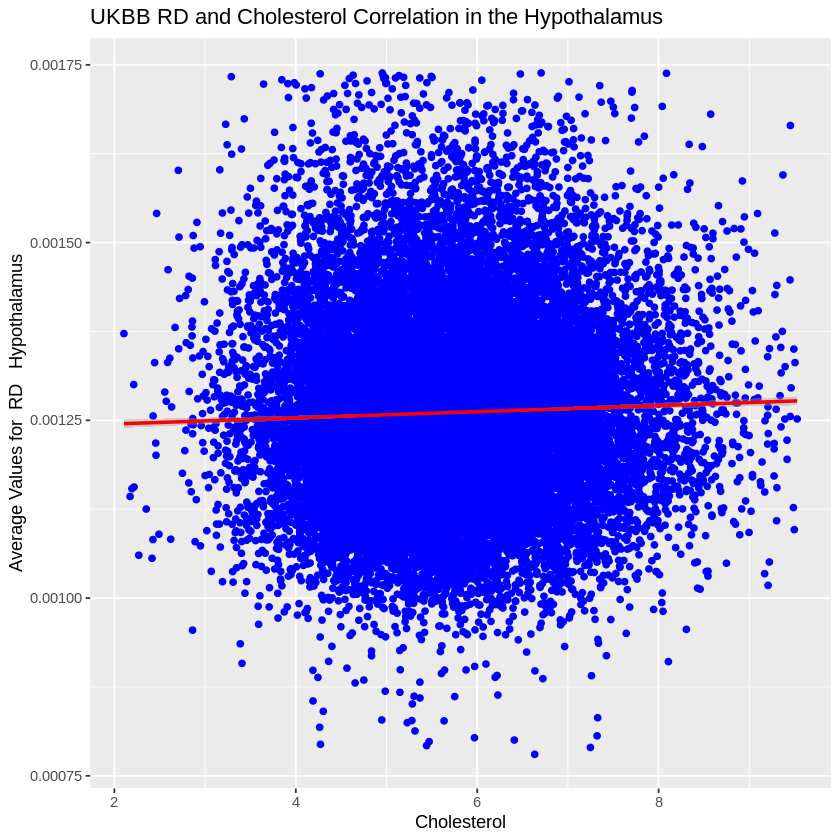

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2384 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2384 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


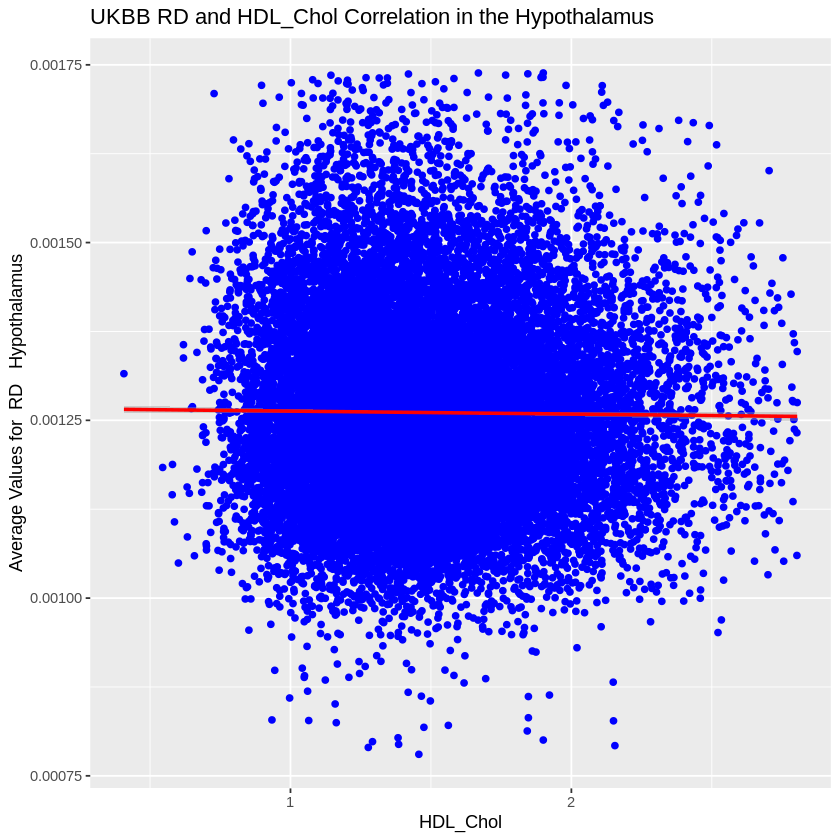

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2837 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2837 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


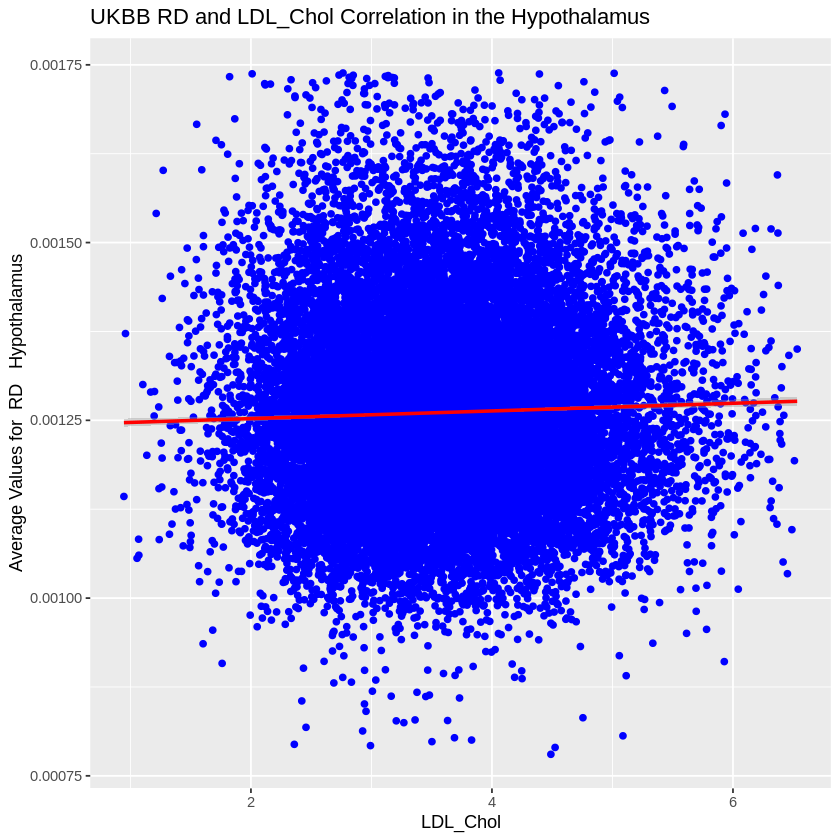

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2857 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2857 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


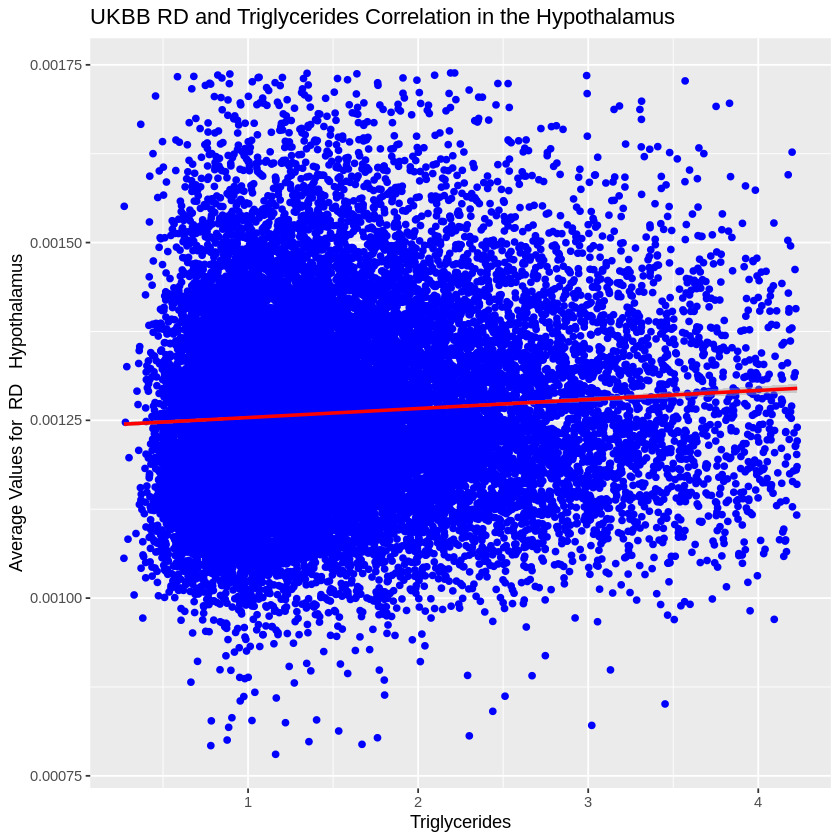

Warning message:
“Use of `current_data[[variable_name]]` is discouraged.
ℹ Use `.data[[variable_name]]` instead.”
Warning message:
“Use of `current_data[[region_name]]` is discouraged.
ℹ Use `.data[[region_name]]` instead.”
Warning message:
“Removed 2815 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 2815 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 26242 rows containing missing values (`geom_text()`).”


[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]

[[26]]

[[27]]

[[28]]

[[29]]

[[30]]

[[31]]

[[32]]

[[33]]

[[34]]

[[35]]

[[36]]

[[37]]

[[38]]

[[39]]

[[40]]

[[41]]

[[42]]

[[43]]

[[44]]

[[45]]

[[46]]

[[47]]

[[48]]

[[49]]

[[50]]

[[51]]

[[52]]

[[53]]

[[54]]

[[55]]

[[56]]

[[57]]

[[58]]

[[59]]

[[60]]


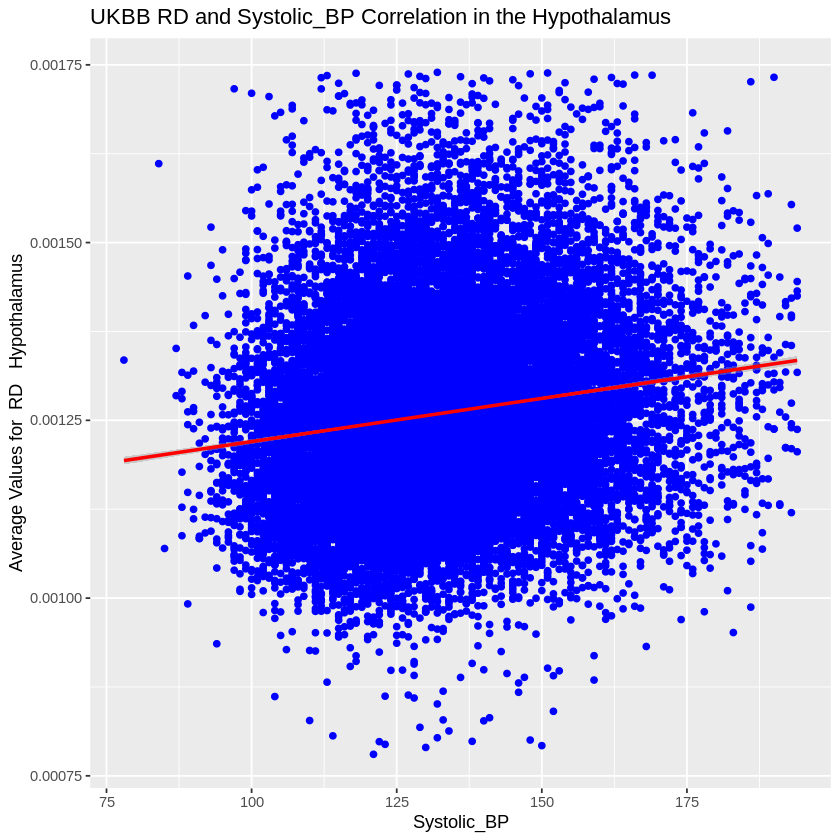

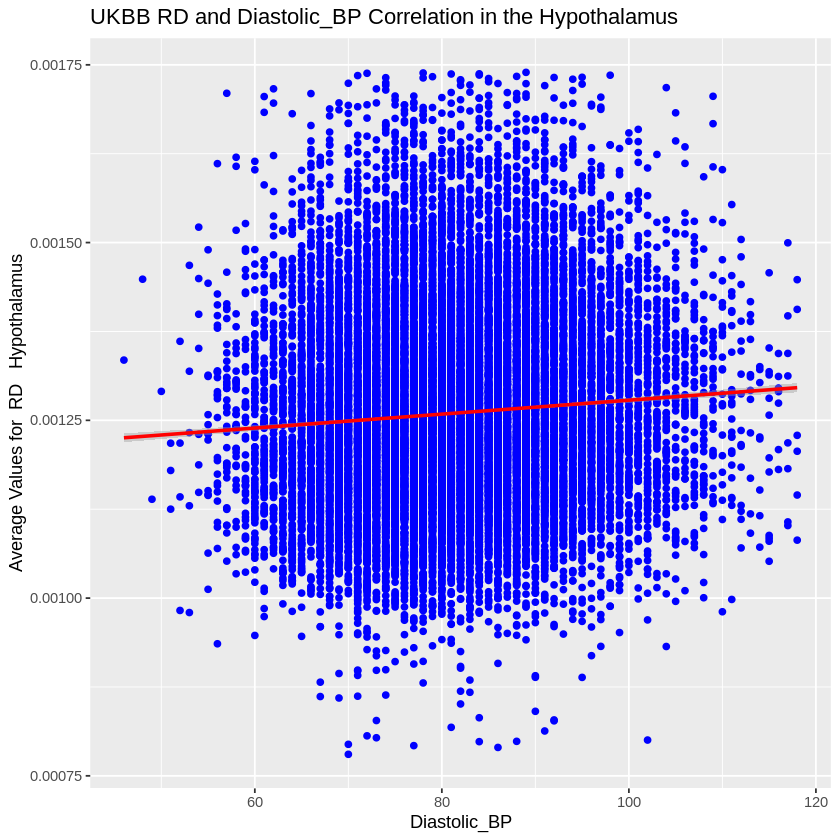

In [9]:
plot_list[181:240]